In [71]:
%matplotlib inline
import os
import json
import random
import warnings

import numpy as np
import pandas as pd
import xarray as xr
import scipy.stats as st
import statsmodels.api as sm
import seaborn as sns

import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
import matplotlib.lines as mlines
import matplotlib.markers as mmark
import matplotlib.patches as mpatches
import matplotlib.path as mpath
import matplotlib.patheffects as pe
import matplotlib.ticker as mticker
import matplotlib.animation as animation
import matplotlib.collections as mcol
from matplotlib.transforms import Bbox, TransformedBbox, blended_transform_factory
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch

from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset, inset_axes

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from eofs.xarray import Eof

from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split, GridSearchCV, LeaveOneOut, RandomizedSearchCV, KFold, RepeatedKFold
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from sklearn.metrics import mean_squared_error, explained_variance_score
from sklearn.neighbors import KernelDensity

from varname import nameof

from regressors import stats

from functools import partial
from pathlib import Path

In [62]:
from shapely.errors import ShapelyDeprecationWarning
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 

In [63]:
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)

In [74]:
plt.rcParams["font.family"] = "Helvetica"

In [75]:
mpl.rcParams['figure.dpi'] = 300

In [76]:
plt.rcParams['axes.facecolor'] = 'none'

# Functions

In [13]:
def lag_linregress_3D(x, y, name='year',lagx=0, lagy=0):
    """
    Input: Two xr.Datarrays of any dimensions with the first dim being time. 
    Thus the input data could be a 1D time series, or for example, have three 
    dimensions (time,lat,lon). 
    Datasets can be provided in any order, but note that the regression slope 
    and intercept will be calculated for y with respect to x.
    Output: Covariance, correlation, regression slope and intercept, p-value, 
    and standard error on regression between the two datasets along their 
    aligned time dimension.  
    Lag values can be assigned to either of the data, with lagx shifting x, and
    lagy shifting y, with the specified lag amount. 
    """ 
    #1. Ensure that the data are properly alinged to each other. 
    x,y = xr.align(x,y)

    #2. Add lag information if any, and shift the data accordingly
    if lagx!=0:

        # If x lags y by 1, x must be shifted 1 step backwards. 
        # But as the 'zero-th' value is nonexistant, xr assigns it as invalid 
        # (nan). Hence it needs to be dropped
        if name == 'time':
            x   = x.shift(time = -lagx).dropna(dim=name)
        elif name == 'time_counter':
            x   = x.shift(time_counter = -lagx).dropna(dim=name)
        else: 
            x   = x.shift(year = -lagx).dropna(dim=name)

        # Next important step is to re-align the two datasets so that y adjusts
        # to the changed coordinates of x
        x,y = xr.align(x,y)

    if lagy!=0:
        if name == 'time':
            y   = y.shift(time = -lagy).dropna(dim=name)
        elif name == 'time_counter':
            y   = y.shift(time_counter = -lagy).dropna(dim=name)
        else:
            y   = y.shift(year = -lagy).dropna(dim=name)
        
        x,y = xr.align(x,y)

    #3. Compute data length, mean and standard deviation along time axis: 
    n = y.notnull().sum(dim=name)
    xmean = x.mean(axis=0)
    ymean = y.mean(axis=0)
    xstd  = x.std(axis=0)
    ystd  = y.std(axis=0)

    #4. Compute covariance along time axis
    cov   =  ((x - xmean)*(y - ymean)).sum(axis=0)/(n)

    #5. Compute correlation along time axis
    cor   = cov/(xstd*ystd)

    #6. Compute regression slope and intercept:
    slope     = cov/(xstd**2)
    intercept = ymean - xmean*slope  

    #7. Compute P-value and standard error
    #Compute t-statistics
    tstats = cor*np.sqrt(n-2)/np.sqrt(1-cor**2)
    stderr = slope/tstats

    from scipy.stats import t
    pval   = t.sf(xu.fabs(tstats), n-2)*2
    pval   = xr.DataArray(pval, dims=cor.dims, coords=cor.coords)
    
    return cov,cor,slope,intercept,pval,stderr

def standardise(data,name=None,weight=xr.DataArray([0.25, 0.5, 0.25], dims=['window'])):
    '''
    Standardise data, applies a 1-2-1 running average, select Oct-April and yearly averages
    '''

    data_bis = data.copy()
        
    data_ = data_bis/data_bis.std()

        
    return data_

def sel_szn(var,name,std=None):
    
    if name == 'time_counter':
        var = var.sel(time_counter=var.time_counter.dt.month.isin([1, 2, 3, 4, 10, 11, 12])).groupby('time_counter.year').mean()
        if std == 'yes':
            var = var/var.std()
        else:
            pass
    
    elif name == 'time':
        var = var.sel(time=var.time.dt.month.isin([1, 2, 3, 4, 10, 11, 12])).groupby('time.year').mean()
        if std == 'yes':
            var = var/var.std()
        else:
            pass
        
    return var

def pattern_approx(nino12,nino4,name='time_counter',szn=None,yr=1000,redone=None,simu=None):
    '''
    Takahashi et al. (2011) approx
    Computes E and C patterns, as well as the ratio of their running variance (default = 1000-yr), 
    and lastly calculates the error on the ratio
    '''
    
    if redone == 'yes':
    
        if simu == 'Vlr01':
            E = -0.46991124458043493*nino4.mean(dim=('lat','lon')) + 2.5189940145331415*nino12.mean(dim=('lat','lon'))
            C = 2.7753029479318334*nino4.mean(dim=('lat','lon')) -1.550206739874219*nino12.mean(dim=('lat','lon'))

        elif simu == 'Sr02':
            E = -0.31983857116216485*nino4.mean(dim=('lat','lon')) + 2.285162519562492*nino12.mean(dim=('lat','lon'))
            C = 2.8462700661473863*nino4.mean(dim=('lat','lon')) -1.4083168303182731*nino12.mean(dim=('lat','lon'))
        
    else :
        E = nino12.mean(dim=('lat','lon')) - 0.5*nino4.mean(dim=('lat','lon'))
        C = 1.7*nino4.mean(dim=('lat','lon')) - 0.1*nino12.mean(dim=('lat','lon'))
    
    if szn == 'yes':
        if name == 'time_counter':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()
        elif name == 'time':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()   
    else:
        if name == 'time_counter':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time_counter=yr,center=True).var()
            C_var = C.rolling(time_counter=yr,center=True).var()
        elif name == 'time':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time=yr,center=True).var()
            C_var = C.rolling(time=yr,center=True).var()
        
    R = E_var/C_var
    
    std_R = R*( (E_var.std()/E_var)**2 + (C_var.std()/C_var)**2 )**0.5
    
    return E,C,R,std_R

def pattern_renjin(nino3,nino4,name='time_counter',szn=None,yr=1000):
    '''
    Ren and Jin (2011) approx
    Computes E and C patterns, as well as the ratio of their running variance (default = 1000-yr), 
    and lastly calculates the error on the ratio
    '''
    nino3_bis = nino3.copy()
    nino3_bis = nino3_bis.mean(dim=('lat','lon'))

    nino4_bis = nino4.copy()
    nino4_bis = nino4_bis.mean(dim=('lat','lon'))
    
    EP = np.zeros((len(nino3_bis)))
    CP = np.zeros((len(nino3_bis)))
    k = 0

    for i,j in zip(nino3_bis.values,nino4_bis.values):
        if i*j > 0:
            EP[k]  = i - 2/5*j
            CP[k]  = j - 2/5*i
        else:
            EP[k]  = i
            CP[k]  = j
            
        k += 1
    
    ds = xr.Dataset(
    {'E': ([name], EP),
     'C': ([name], CP)},
    coords={
     name: ([name], nino3_bis[name].values)
        
    })
    
    E = ds.E
    C = ds.C
    
    if szn == 'yes':
        if name == 'time_counter':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()
        elif name == 'time':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()   
    else:
        if name == 'time_counter':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time_counter=yr,center=True).var()
            C_var = C.rolling(time_counter=yr,center=True).var()
        elif name == 'time':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time=yr,center=True).var()
            C_var = C.rolling(time=yr,center=True).var()

    R = E_var/C_var
    
    std_R = R*( (E_var.std().values/E_var)**2 + (C_var.std().values/C_var)**2 )**0.5
    
    return E,C,R,std_R

def variance_ratio(E,C,name='time_counter',szn=None,yr=1000):
    
    if szn == 'yes':
        if name == 'time_counter':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()
        elif name == 'time':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()   
    else:
        if name == 'time_counter':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time_counter=yr,center=True).var()
            C_var = C.rolling(time_counter=yr,center=True).var()
        elif name == 'time':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time=yr,center=True).var()
            C_var = C.rolling(time=yr,center=True).var()
    
    R = E_var/C_var
    
    return R

def pattern_exact(PC1,PC2,name='time_counter',szn=None,yr=1000):
    '''
    Takahashi et al. (2011) exact
    Computes E and C patterns, as well as the ratio of their running variance (default = 1000-yr), 
    and lastly calculates the error on the ratio
    '''
    E = (PC1 - PC2)/np.sqrt(2)
    C = (PC1 + PC2)/np.sqrt(2)
    
    if szn == 'yes':
        if name == 'time_counter':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()
        elif name == 'time':
            E = sel_szn(E,name)
            C = sel_szn(C,name)
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(year=yr,center=True).var()
            C_var = C.rolling(year=yr,center=True).var()   
    else:
        if name == 'time_counter':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time_counter=yr,center=True).var()
            C_var = C.rolling(time_counter=yr,center=True).var()
        elif name == 'time':
            E = E/E.std()
            C = C/C.std()
            E_var = E.rolling(time=yr,center=True).var()
            C_var = C.rolling(time=yr,center=True).var()
    
    R = E_var/C_var
    
    std_R = R*( (E_var.std().values/E_var)**2 + (C_var.std().values/C_var)**2 )**0.5
    
    return E,C,R,std_R
    
def reg_(sst,E,C):
    '''
    Computes regression pattern for E and C, and their associated pval
    Need lag_linregress_3D function
    '''
    
    regE = lag_linregress_3D(sst,E)[2]
    regE_pval = lag_linregress_3D(sst,E)[4]
    regC = lag_linregress_3D(sst,C)[2]
    regC_pval = lag_linregress_3D(sst,C)[4]

    return regE,regE_pval,regC,regC_pval

def lasso_model(X,y):

    alphas = 10**np.linspace(10,-2,100)*0.5
    X_train, X_test , y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=1)

    lasso = Lasso(max_iter = 10000)
    coefs = []

    for a in alphas:
        lasso.set_params(alpha=a)
        lasso.fit(scale(X_train), y_train)
        coefs.append(lasso.coef_)

    lassocv = LassoCV(alphas = None, cv = RepeatedKFold(n_splits=5, n_repeats=10, random_state=1), 
                      max_iter = 100000)
    lassocv.fit(X_train, y_train)

    lasso.set_params(alpha=lassocv.alpha_)
    lasso.fit(X_train, y_train)
    mean_squared_error(y_test, lasso.predict(X_test))
    
    print('alpha=',lassocv.alpha_)
    
    return lasso.fit(X_train, y_train)

    
def ttest(model, obs):
    
    tstat, pval = scipy.stats.ttest_ind(
    model.values,
    obs.values,
    equal_var=False,
    nan_policy='propagate',
    )
    
    t_test = xr.Dataset(
    {'t_stat': (['lat', 'lon'], tstat),
     'pval': (['lat', 'lon'], pval)},
    coords={
     'lon': (['lon'], model.lon.values),
     'lat': (['lat'], model.lat.values)
    })
    
    return t_test

def bootstrap_percentage(y,x,iterations=10000,subset=100):

    boot = np.zeros(len(np.linspace(0,iterations,iterations)))
    
    x = x[~np.isnan(x)]
    y = y[~np.isnan(y)]
    
    for i in range(iterations):
        
        x_rand_samples = np.random.choice(x.values, subset, replace=False)
        y_rand_samples = np.random.choice(y.values, subset, replace=False)
        
        boot[i] = np.nanmean(x_rand_samples)/np.nanmean(y_rand_samples)*100
        
    return np.std(boot)


def reg(sst,E,C,name='year'):
    '''
    Computes regression pattern for E and C, and their associated pval
    Need lag_linregress_3D function
    '''
    
    regE = lag_linregress_3D(E,sst,name)[2]
    regE_pval = lag_linregress_3D(E,sst,name)[4]
    regC = lag_linregress_3D(C,sst,name)[2]
    regC_pval = lag_linregress_3D(C,sst,name)[4]

    return regE,regE_pval,regC,regC_pval

def bootstrap_sample(x,estimator='std',iterations=10000,confidence='90%'):

    sample_size = len(x)
    bootstrap_reps = iterations
    
    sample = x

    # Function to generate bootstrap samples
    bootstrap_sample = lambda: np.random.choice(x, size=sample_size, replace=True)

    # The sample mean is an estimator of the population mean
    
    if estimator == 'std':
        estimator = np.std
        
    elif estimator == 'mean':
        estimator = np.mean
        
    else:
        'Choose an estimator!'


    sample_statistic = estimator(sample)
    bootstrapped_statistics = [
        estimator(bootstrap_sample())
        for _ in range(bootstrap_reps)
    ]


    # Lower and upper limit of the 95% confidence interval for the population parameter
    if confidence == '90%':
        z_alpha = 1.645
    elif confidence == '95%':
        z_alpha = 1.96
    elif confidence == '98%':
        z_alpha = 2.326
    elif confidence == '99%':
        z_alpha = 2.576
    else:
        print('Choose right confidence level :)!')
        
    ci_lower = sample_statistic - z_alpha * np.std(bootstrapped_statistics)
    ci_upper = sample_statistic + z_alpha * np.std(bootstrapped_statistics)
            
    return ci_lower,ci_upper

def bootstrap_sample_mean(x,iterations=10000,confidence='90%'):

    sample_size = len(x)
    bootstrap_reps = iterations
    
    sample = x

    # Function to generate bootstrap samples
    bootstrap_sample = lambda: np.random.choice(x, size=sample_size, replace=True)

    # The sample mean is an estimator of the population mean
    estimator = np.mean

    sample_statistic = estimator(sample)
    bootstrapped_statistics = [
        estimator(bootstrap_sample())
        for _ in range(bootstrap_reps)
    ]


    # Lower and upper limit of the 95% confidence interval for the population parameter
    if confidence == '90%':
        z_alpha = 1.645
    elif confidence == '95%':
        z_alpha = 1.96
    elif confidence == '98%':
        z_alpha = 2.326
    elif confidence == '99%':
        z_alpha = 2.576
    else:
        print('Choose right confidence level :)!')
        
    return np.mean(bootstrapped_statistics)

def Carre_box(ds,var=None):
    
    if var=='sst':
        EP = ds.sel(lat=slice(-20,-8),lon=slice(278,290)).sst.mean(dim=('lat','lon'))
        CP = ds.sel(lat=slice(0,8),lon=slice(194,206)).sst.mean(dim=('lat','lon'))
        
    elif var=='tos':
        
        EP = ds.sel(lat=slice(-20,-8),lon=slice(278,290)).tos.mean(dim=('lat','lon'))
        CP = ds.sel(lat=slice(0,8),lon=slice(194,206)).tos.mean(dim=('lat','lon'))
        
    else:
        EP = ds.sel(lat=slice(-20,-8),lon=slice(278,290)).mean(dim=('lat','lon'))
        CP = ds.sel(lat=slice(0,8),lon=slice(194,206)).mean(dim=('lat','lon'))      
        
    return EP,CP

# Main code

### Defining path

In [7]:
data_folder = Path(".")

### Importing principal components (PC) from simulations, 6000-0 yr BP

In [8]:
PC1_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/pc_Vlr01_00000.nc') 
PC2_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/pc_Vlr01_00001.nc') 

PC1_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/pc_Sr02_00000.nc') 
PC2_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/pc_Sr02_00001.nc') 

### Importing SST in Niño4 and Niño1+2 from simulations, 6000-0 yr BP

In [11]:
nino4_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/nino4_Vlr01_bp.nc') 
nino12_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/nino12_Vlr01_bp.nc') 

nino4_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/nino4_Sr02_bp.nc') 
nino12_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/nino12_Sr02_bp.nc') 

### Computing M1 from simulations, 6000-0 yr BP

In [14]:
PC1_Vlr01_ = standardise((-PC1_Vlr01).tos,'time_counter')
PC2_Vlr01_ = standardise((-PC2_Vlr01).tos,'time_counter')

PC1_Sr02_ = standardise(PC1_Sr02.tos,'time_counter')
PC2_Sr02_ = standardise((-PC2_Sr02).tos,'time_counter')

In [15]:
E_Vlr01,C_Vlr01,R_Vlr01,std_R_Vlr01 = pattern_exact(PC1_Vlr01_[:,0,0],PC2_Vlr01_[:,0,0],'time_counter','yes',500)
E_Sr02,C_Sr02,R_Sr02,std_R_Sr02 = pattern_exact(PC1_Sr02_[:,0,0],PC2_Sr02_[:,0,0],'time_counter','yes',500)

### Computing M2 from simulations, 6000-0 yr BP

In [16]:
E_Vlr01_,C_Vlr01_,R_Vlr01_,std_R_Vlr01_ = pattern_approx(nino12_Vlr01.tos,nino4_Vlr01.tos,'time_counter','yes',500)
E_Sr02_,C_Sr02_,R_Sr02_,std_R_Sr02_ = pattern_approx(nino12_Sr02.tos,nino4_Sr02.tos,'time_counter','yes',500)


In [17]:
E_Vlr01,C_Vlr01,R_Vlr01,std_R_Vlr01 = pattern_exact(PC1_Vlr01_[:,0,0],PC2_Vlr01_[:,0,0],'time_counter','yes',500)
E_Sr02,C_Sr02,R_Sr02,std_R_Sr02 = pattern_exact(PC1_Sr02_[:,0,0],PC2_Sr02_[:,0,0],'time_counter','yes',500)

### Carré et al. (2021) from simulations, 6000-0 yr BP

In [18]:
EP_Carre_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/EP_Carre_Vlr01.nc')['tos']
CP_Carre_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/CP_Carre_Vlr01.nc')['tos']  

EP_Carre_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/EP_Carre_Sr02.nc')['tos']
CP_Carre_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/CP_Carre_Sr02.nc')['tos']

In [19]:
R_Carre_Vlr01 = variance_ratio(EP_Carre_Vlr01[:,0,0], CP_Carre_Vlr01[:,0,0],'time_counter','yes',500)
R_Carre_Sr02 = variance_ratio(EP_Carre_Sr02[:,0,0], CP_Carre_Sr02[:,0,0],'time_counter','yes',500)

In [20]:
EP_Carre_Vlr01 = sel_szn(EP_Carre_Vlr01[:,0,0],'time_counter','yes')
CP_Carre_Vlr01 = sel_szn(CP_Carre_Vlr01[:,0,0],'time_counter','yes')

EP_Carre_Sr02 = sel_szn(EP_Carre_Sr02[:,0,0],'time_counter','yes')
CP_Carre_Sr02 = sel_szn(CP_Carre_Sr02[:,0,0],'time_counter','yes')

### Ren & Jin (2011) from simulations, 6000-0 yr BP

In [23]:
nino3_Vlr01_lonlat = xr.open_dataset(data_folder/'eof_holocene/Vlr01/nino3_Vlr01_bp.nc').tos

In [24]:
nino3_Sr02_lonlat = xr.open_dataset(data_folder/'eof_holocene/Sr02/nino3_Sr02_bp.nc').tos

In [25]:
E_Sr02_rj,C_Sr02_rj,R_Sr02_rj,_ = pattern_renjin(nino3_Sr02_lonlat,nino4_Sr02.tos,name='time_counter',szn='yes',yr=500)
E_Vlr01_rj,C_Vlr01_rj,R_Vlr01_rj,_ = pattern_renjin(nino3_Vlr01_lonlat,nino4_Vlr01.tos,name='time_counter',szn='yes',yr=500)

### Importing regression patterns from simulations, 6000-0 yr BP

In [26]:
regress = xr.open_dataset(data_folder/'eof_holocene/reg_simulations_6-0k.nc')

### Calibration of M1 on M2, 6000-0 yr BP

In [27]:
E_Vlr01_bis,C_Vlr01_bis,_,_ = pattern_exact(PC1_Vlr01_[:,0,0],PC2_Vlr01_[:,0,0],'time_counter',500)
E_Sr02_bis,C_Sr02_bis,_,_ = pattern_exact(PC1_Sr02_[:,0,0],PC2_Sr02_[:,0,0],'time_counter',500)

In [28]:
df_Vlr01 = pd.DataFrame({'nino12':nino12_Vlr01.tos.mean(dim=('lat','lon')).values,
                                      'nino4':nino4_Vlr01.tos.mean(dim=('lat','lon')).values,
                                    'C':C_Vlr01_bis.values,
                                     'E':E_Vlr01_bis.values})

In [29]:
df_Sr02 = pd.DataFrame({'nino12':nino12_Sr02.tos.mean(dim=('lat','lon')).values,
                                      'nino4':nino4_Sr02.tos.mean(dim=('lat','lon')).values,
                                    'C':C_Sr02_bis.values,
                                     'E':E_Sr02_bis.values})

In [30]:
X_Vlr01_C = df_Vlr01[['nino4', 'nino12']]
y_Vlr01_C = df_Vlr01['C']

X_Vlr01_E = df_Vlr01[['nino4', 'nino12']]
y_Vlr01_E = df_Vlr01['E']

X_Sr02_C = df_Sr02[['nino4', 'nino12']]
y_Sr02_C = df_Sr02['C']

X_Sr02_E = df_Sr02[['nino4', 'nino12']]
y_Sr02_E = df_Sr02['E']

#####

reg_Vlr01_C = lasso_model(X_Vlr01_C,y_Vlr01_C)
reg_Vlr01_E = lasso_model(X_Vlr01_E,y_Vlr01_E)

reg_Sr02_C = lasso_model(X_Sr02_C,y_Sr02_C)
reg_Sr02_E = lasso_model(X_Sr02_E,y_Sr02_E)


alpha= 0.00038004900650940275
alpha= 0.0002969099802088859
alpha= 0.00036220893490650647
alpha= 0.0003207019300967846


In [31]:
_,_,R_Vlr01_bis,_ = pattern_approx(nino12_Vlr01.tos,nino4_Vlr01.tos,'time_counter','yes',500,'yes','Vlr01')
_,_,R_Sr02_bis,_ = pattern_approx(nino12_Sr02.tos,nino4_Sr02.tos,'time_counter','yes',500,'yes','Sr02')

### Multilinear regression on Niño1+2 and Niño4 boxes, 6000-0 yr BP

#### M1

In [32]:
year = 500
cut = int(500/2)

df_EP_Vlr01 = pd.DataFrame({'tot':standardise(sel_szn(nino12_Vlr01.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Vlr01.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Vlr01.rolling(year=year,center=True).var().values[cut:-cut]})

df_CP_Vlr01 = pd.DataFrame({'tot':standardise(sel_szn(nino4_Vlr01.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Vlr01.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Vlr01.rolling(year=year,center=True).var().values[cut:-cut]})

df_EP_Sr02 = pd.DataFrame({'tot':standardise(sel_szn(nino12_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Sr02.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Sr02.rolling(year=year,center=True).var().values[cut:-cut]})

df_CP_Sr02 = pd.DataFrame({'tot':standardise(sel_szn(nino4_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Sr02.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Sr02.rolling(year=year,center=True).var().values[cut:-cut]})

In [33]:
X_CP_Vlr01 = df_CP_Vlr01[['E', 'C']]
y_CP_Vlr01 = df_CP_Vlr01['tot']

X_EP_Vlr01 = df_EP_Vlr01[['E', 'C']]
y_EP_Vlr01 = df_EP_Vlr01['tot']

X_CP_Sr02 = df_CP_Sr02[['E', 'C']]
y_CP_Sr02 = df_CP_Sr02['tot']

X_EP_Sr02 = df_EP_Sr02[['E', 'C']]
y_EP_Sr02 = df_EP_Sr02['tot']
    
reg_CP_Vlr01 = lasso_model(X_CP_Vlr01, y_CP_Vlr01)
reg_EP_Vlr01 = lasso_model(X_EP_Vlr01, y_EP_Vlr01)

reg_CP_Sr02 = lasso_model(X_CP_Sr02, y_CP_Sr02)
reg_EP_Sr02 = lasso_model(X_EP_Sr02, y_EP_Sr02)

alpha= 2.1818028969319202e-05
alpha= 1.8991165634174858e-05
alpha= 1.2666502807096382e-05
alpha= 9.745104745621179e-06


#### M2

In [34]:
df_EP_Vlr01_ = pd.DataFrame({'tot':standardise(sel_szn(nino12_Vlr01.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Vlr01_.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Vlr01_.rolling(year=year,center=True).var().values[cut:-cut]})

df_CP_Vlr01_ = pd.DataFrame({'tot':standardise(sel_szn(nino4_Vlr01.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Vlr01_.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Vlr01_.rolling(year=year,center=True).var().values[cut:-cut]})

df_EP_Sr02_ = pd.DataFrame({'tot':standardise(sel_szn(nino12_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Sr02_.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Sr02_.rolling(year=year,center=True).var().values[cut:-cut]})

df_CP_Sr02_ = pd.DataFrame({'tot':standardise(sel_szn(nino4_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=year,center=True).var().values[cut:-cut],
                    'C':C_Sr02_.rolling(year=year,center=True).var().values[cut:-cut],
                     'E':E_Sr02_.rolling(year=year,center=True).var().values[cut:-cut]})

In [35]:
X_CP_Vlr01_ = df_CP_Vlr01_[['E', 'C']]
y_CP_Vlr01_ = df_CP_Vlr01_['tot']

X_EP_Vlr01_ = df_EP_Vlr01_[['E', 'C']]
y_EP_Vlr01_ = df_EP_Vlr01_['tot']

X_CP_Sr02_ = df_CP_Sr02_[['E', 'C']]
y_CP_Sr02_ = df_CP_Sr02_['tot']

X_EP_Sr02_ = df_EP_Sr02_[['E', 'C']]
y_EP_Sr02_ = df_EP_Sr02_['tot']
    
reg_CP_Vlr01_ = lasso_model(X_CP_Vlr01_, y_CP_Vlr01_)
reg_EP_Vlr01_ = lasso_model(X_EP_Vlr01_, y_EP_Vlr01_)

reg_CP_Sr02_ = lasso_model(X_CP_Sr02_, y_CP_Sr02_)
reg_EP_Sr02_ = lasso_model(X_EP_Sr02_, y_EP_Sr02_)

alpha= 2.8080740715536598e-05
alpha= 2.300527570545558e-05
alpha= 1.7010998501356987e-05
alpha= 1.136911626877046e-05


### Importing SST data from observational products (1854-1950, 1950-2019)

In [36]:
cobe_sst2_1854_1950 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/COBE_SST2_1854_1950_bp.nc')
cobe_sst2_1950_2019 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/COBE_SST2_1950_2019_bp.nc')

In [37]:
ERSSTv5_1854_1950 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/ERSSTv5_1854_1950_bp.nc')
ERSSTv5_1950_2019 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/ERSSTv5_1950_2019_bp.nc')

### Computing Carré et al. (2021), 1854-1950, 1950-2019

In [38]:
E_cobe_sst2_1950_2019_Carre, C_cobe_sst2_1950_2019_Carre = Carre_box(cobe_sst2_1950_2019,'sst')
E_ERSSTv5_1950_2019_Carre, C_ERSSTv5_1950_2019_Carre = Carre_box(ERSSTv5_1950_2019,'sst')

In [39]:
E_cobe_sst2_1950_2019_Carre = sel_szn(E_cobe_sst2_1950_2019_Carre,'time','yes')
C_cobe_sst2_1950_2019_Carre = sel_szn(C_cobe_sst2_1950_2019_Carre,'time','yes')

E_ERSSTv5_1950_2019_Carre = sel_szn(E_ERSSTv5_1950_2019_Carre,'time','yes')
C_ERSSTv5_1950_2019_Carre = sel_szn(C_ERSSTv5_1950_2019_Carre,'time','yes')

### Importing regression patterns from simulations (1854-1950) and observational products (1854-1950, 1950-2019)

In [40]:
reg_ERSSTv5 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/reg_ERSSTv5.nc')
reg_cobe_sst2 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/reg_cobe_sst2.nc')
reg_simulations = xr.open_dataset(data_folder/'eof_present/simulations/reg_simulations.nc')

### Importing principal components (PC) and Niño boxes from simulations, 1854-1950

In [42]:
PC1_Vlr01_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Vlr01/pc_tos_Vlr01_1854_1950_00000.nc')
PC2_Vlr01_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Vlr01/pc_tos_Vlr01_1854_1950_00001.nc')
nino4_Vlr01_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Vlr01/nino4_Vlr01_1854_1950.nc')
nino12_Vlr01_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Vlr01/nino12_Vlr01_1854_1950.nc')
nino3_Vlr01_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Vlr01/nino3_Vlr01_1854_1950.nc')

PC1_Sr02_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Sr02/pc_tos_Sr02_1854_1950_00000.nc')
PC2_Sr02_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Sr02/pc_tos_Sr02_1854_1950_00001.nc')
nino4_Sr02_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Sr02/nino4_Sr02_1854_1950.nc')
nino12_Sr02_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Sr02/nino12_Sr02_1854_1950.nc')
nino3_Sr02_1854_1950 = xr.open_dataset(data_folder/'eof_present/simulations/Sr02/nino3_Sr02_1854_1950.nc')

### Importing principal components (PC) and Niño boxes from ERSSTv5, 1854-1950, 1950-2019

In [45]:
PC1_ERSSTv5_1854_1950 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/pc_ERSSTv5_1854_1950_00000.nc')
PC2_ERSSTv5_1854_1950 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/pc_ERSSTv5_1854_1950_00001.nc')
nino4_ERSSTv5_1854_1950 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/nino4_ERSSTv5_1854_1950.nc')
nino12_ERSSTv5_1854_1950 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/nino12_ERSSTv5_1854_1950.nc')
nino3_ERSSTv5_1854_1950 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/nino3_ERSSTv5_1854_1950.nc')

PC1_ERSSTv5_1950_2019 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/pc_ERSSTv5_1950_2019_00000.nc')
PC2_ERSSTv5_1950_2019 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/pc_ERSSTv5_1950_2019_00001.nc')
nino4_ERSSTv5_1950_2019 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/nino4_ERSSTv5_1950_2019.nc')
nino12_ERSSTv5_1950_2019 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/nino12_ERSSTv5_1950_2019.nc')
nino3_ERSSTv5_1950_2019 = xr.open_dataset(data_folder/'eof_present/ERSSTv5/nino3_ERSSTv5_1950_2019.nc')

### Importing principal components (PC) and Niño boxes from COBE-SST2, 1854-1950, 1950-2019

In [46]:
PC1_cobe_sst2_1854_1950 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/pc_COBE_SST2_1854_1950_00000.nc')
PC2_cobe_sst2_1854_1950 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/pc_COBE_SST2_1854_1950_00001.nc')
nino4_cobe_sst2_1854_1950 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/nino4_COBE_SST2_1854_1950.nc')
nino12_cobe_sst2_1854_1950 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/nino12_COBE_SST2_1854_1950.nc')
nino3_cobe_sst2_1854_1950 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/nino3_COBE_SST2_1854_1950.nc')

PC1_cobe_sst2_1950_2019 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/pc_COBE_SST2_1950_2019_00000.nc')
PC2_cobe_sst2_1950_2019 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/pc_COBE_SST2_1950_2019_00001.nc')
nino4_cobe_sst2_1950_2019 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/nino4_COBE_SST2_1950_2019.nc')
nino12_cobe_sst2_1950_2019 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/nino12_COBE_SST2_1950_2019.nc')
nino3_cobe_sst2_1950_2019 = xr.open_dataset(data_folder/'eof_present/COBE_SST2/nino3_COBE_SST2_1950_2019.nc')

### Computing M1 for simulations (1854-1950) and observational products (1854-1950, 1950-2019)

In [47]:
PC1_Vlr01_1854_1950_ = standardise(PC1_Vlr01_1854_1950.tos,'time_counter')
PC2_Vlr01_1854_1950_ = standardise(PC2_Vlr01_1854_1950.tos,'time_counter')

PC1_Sr02_1854_1950_ = standardise((-PC1_Sr02_1854_1950).tos,'time_counter')
PC2_Sr02_1854_1950_ = standardise((-PC2_Sr02_1854_1950).tos,'time_counter')

PC1_ERSSTv5_1854_1950_ = standardise((-PC1_ERSSTv5_1854_1950).sst,'time')
PC2_ERSSTv5_1854_1950_ = standardise(PC2_ERSSTv5_1854_1950.sst,'time')

PC1_ERSSTv5_1950_2019_ = standardise(PC1_ERSSTv5_1950_2019.sst,'time')
PC2_ERSSTv5_1950_2019_ = standardise((-PC2_ERSSTv5_1950_2019).sst,'time')

PC1_cobe_sst2_1854_1950_ = standardise((-PC1_cobe_sst2_1854_1950).sst,'time')
PC2_cobe_sst2_1854_1950_ = standardise(PC2_cobe_sst2_1854_1950.sst,'time')

PC1_cobe_sst2_1950_2019_ = standardise(PC1_cobe_sst2_1950_2019.sst,'time')
PC2_cobe_sst2_1950_2019_ = standardise(PC2_cobe_sst2_1950_2019.sst,'time')

In [48]:
E_Vlr01_1854_1950,C_Vlr01_1854_1950,R_Vlr01_1854_1950,std_R_Vlr01_1854_1950 = pattern_exact(PC1_Vlr01_1854_1950_,PC2_Vlr01_1854_1950_,'time_counter','yes',10)
E_Sr02_1854_1950,C_Sr02_1854_1950,R_Sr02_1854_1950,std_R_Sr02_1854_1950 = pattern_exact(PC1_Sr02_1854_1950_,PC2_Sr02_1854_1950_,'time_counter','yes',10)

E_ERSSTv5_1854_1950,C_ERSSTv5_1854_1950,R_ERSSTv5_1854_1950,std_R_ERSSTv5_1854_1950 = pattern_exact(PC1_ERSSTv5_1854_1950_,PC2_ERSSTv5_1854_1950_,'time','yes',10)
E_ERSSTv5_1950_2019,C_ERSSTv5_1950_2019,R_ERSSTv5_1950_2019,std_R_ERSSTv5_1950_2019 = pattern_exact(PC1_ERSSTv5_1950_2019_,PC2_ERSSTv5_1950_2019_,'time','yes',10)

E_cobe_sst2_1854_1950,C_cobe_sst2_1854_1950,R_cobe_sst2_1854_1950,std_R_cobe_sst2_1854_1950 = pattern_exact(PC1_cobe_sst2_1854_1950_ ,PC2_cobe_sst2_1854_1950_,'time','yes',10)
E_cobe_sst2_1950_2019,C_cobe_sst2_1950_2019,R_cobe_sst2_1950_2019,std_R_cobe_sst2_1950_2019 = pattern_exact(PC1_cobe_sst2_1950_2019_,PC2_cobe_sst2_1950_2019_,'time','yes',10)

### Computing M2 and Ren & Jin (2011) for simulations (1854-1950) and observational products (1854-1950, 1950-2019)

In [49]:
E_Vlr01_1854_1950_,C_Vlr01_1854_1950_,R_Vlr01_1854_1950_,std_R_Vlr01_1854_1950_ = pattern_approx(nino12_Vlr01_1854_1950.tos,nino4_Vlr01_1854_1950.tos,'time_counter','yes',10)
E_Vlr01_1854_1950_rj,C_Vlr01_1854_1950_rj,R_Vlr01_1854_1950_rj,std_R_Vlr01_1854_1950_rj = pattern_renjin(nino3_Vlr01_1854_1950.tos,nino4_Vlr01_1854_1950.tos,'time_counter','yes',10)

E_Sr02_1854_1950_,C_Sr02_1854_1950_,R_Sr02_1854_1950_,std_R_Sr02_1854_1950_ = pattern_approx(nino12_Sr02_1854_1950.tos,nino4_Sr02_1854_1950.tos,'time_counter','yes',10)
E_Sr02_1854_1950_rj,C_Sr02_1854_1950_rj,R_Sr02_1854_1950_rj,std_R_Sr02_1854_1950_rj = pattern_renjin(nino3_Sr02_1854_1950.tos,nino4_Sr02_1854_1950.tos,'time_counter','yes',10)

E_ERSSTv5_1854_1950_,C_ERSSTv5_1854_1950_,R_ERSSTv5_1854_1950_,std_R_ERSSTv5_1854_1950_ = pattern_approx(nino12_ERSSTv5_1854_1950.sst,nino4_ERSSTv5_1854_1950.sst,'time','yes',10)
E_ERSSTv5_1854_1950_rj,C_ERSSTv5_1854_1950_rj,R_ERSSTv5_1854_1950_rj,std_R_ERSSTv5_1854_1950_rj  = pattern_approx(nino3_ERSSTv5_1854_1950.sst,nino4_ERSSTv5_1854_1950.sst,'time','yes',10)

E_ERSSTv5_1950_2019_,C_ERSSTv5_1950_2019_,R_ERSSTv5_1950_2019_,std_R_ERSSTv5_1950_2019_ = pattern_approx(nino12_ERSSTv5_1950_2019.sst,nino4_ERSSTv5_1950_2019.sst,'time','yes',10)
E_ERSSTv5_1950_2019_rj,C_ERSSTv5_1950_2019_rj,R_ERSSTv5_1950_2019_rj,std_R_ERSSTv5_1950_2019_rj = pattern_renjin(nino3_ERSSTv5_1950_2019.sst,nino4_ERSSTv5_1950_2019.sst,'time','yes',10)

E_cobe_sst2_1854_1950_,C_cobe_sst2_1854_1950_,R_cobe_sst2_1854_1950_,std_R_cobe_sst2_1854_1950_ = pattern_approx(nino12_cobe_sst2_1854_1950.sst,nino4_cobe_sst2_1854_1950.sst,'time','yes',10)
E_cobe_sst2_1854_1950_rj,C_cobe_sst2_1854_1950_rj,R_cobe_sst2_1854_1950_rj,std_R_cobe_sst2_1854_1950_rj = pattern_renjin(nino3_cobe_sst2_1854_1950.sst,nino4_cobe_sst2_1854_1950.sst,'time','yes',10)

E_cobe_sst2_1950_2019_,C_cobe_sst2_1950_2019_,R_cobe_sst2_1950_2019_,std_R_cobe_sst2_1950_2019_ = pattern_approx(nino12_cobe_sst2_1950_2019.sst,nino4_cobe_sst2_1950_2019.sst,'time','yes',10)
E_cobe_sst2_1950_2019_rj,C_cobe_sst2_1950_2019_rj,R_cobe_sst2_1950_2019_rj,std_R_cobe_sst2_1950_2019_rj = pattern_renjin(nino3_cobe_sst2_1950_2019.sst,nino4_cobe_sst2_1950_2019.sst,'time','yes',10)

### Setting same time axis as observations for simulations, 1854-1950

In [50]:
E_Vlr01_1854_1950_['year'] = E_cobe_sst2_1854_1950.year.values
E_Vlr01_1854_1950_rj['year'] = E_cobe_sst2_1854_1950.year.values

E_Sr02_1854_1950_['year'] = E_cobe_sst2_1854_1950.year.values
E_Sr02_1854_1950_rj['year'] = E_cobe_sst2_1854_1950.year.values

C_Vlr01_1854_1950_['year'] = E_cobe_sst2_1854_1950.year.values
C_Vlr01_1854_1950_rj['year'] = E_cobe_sst2_1854_1950.year.values

C_Sr02_1854_1950_['year'] = E_cobe_sst2_1854_1950.year.values
C_Sr02_1854_1950_rj['year'] = E_cobe_sst2_1854_1950.year.values

E_Vlr01_1854_1950['year'] = E_cobe_sst2_1854_1950.year.values
E_Sr02_1854_1950['year'] = E_cobe_sst2_1854_1950.year.values

C_Vlr01_1854_1950['year'] = E_cobe_sst2_1854_1950.year.values
C_Sr02_1854_1950['year'] = E_cobe_sst2_1854_1950.year.values

### Calibration of M2 on M1 for observational products, 1854-1950

In [51]:
E_ERSSTv5_1854_1950_bis,C_ERSSTv5_1854_1950_bis,_,_ = pattern_exact(PC1_ERSSTv5_1854_1950_,PC2_ERSSTv5_1854_1950_,'time',10)
E_ERSSTv5_1950_2019_bis,C_ERSSTv5_1950_2019_bis,_,_ = pattern_exact(PC1_ERSSTv5_1950_2019_,PC2_ERSSTv5_1950_2019_,'time',10)

E_cobe_sst2_1854_1950_bis,C_cobe_sst2_1854_1950_bis,_,_ = pattern_exact(PC1_cobe_sst2_1854_1950_ ,PC2_cobe_sst2_1854_1950_,'time',10)
E_cobe_sst2_1950_2019_bis,C_cobe_sst2_1950_2019_bis,_,_ = pattern_exact(PC1_cobe_sst2_1950_2019_,PC2_cobe_sst2_1950_2019_,'time',10)

In [52]:
df_cobe = pd.DataFrame({'nino12':nino12_cobe_sst2_1854_1950.sst.mean(dim=('lat','lon')).values,
                                      'nino4':nino4_cobe_sst2_1854_1950.sst.mean(dim=('lat','lon')).values,
                                    'C':C_cobe_sst2_1854_1950_bis[:,0,0].values,
                                     'E':E_cobe_sst2_1854_1950_bis[:,0,0].values})

df_ersstv5 = pd.DataFrame({'nino12':nino12_ERSSTv5_1854_1950.sst.mean(dim=('lat','lon')).values,
                                      'nino4':nino4_ERSSTv5_1854_1950.sst.mean(dim=('lat','lon')).values,
                                    'C':C_ERSSTv5_1854_1950_bis[:,0,0].values,
                                     'E':E_ERSSTv5_1854_1950_bis[:,0,0].values})

X_cobe_C = df_cobe[['nino4', 'nino12']]
y_cobe_C = df_cobe['C']

X_cobe_E = df_cobe[['nino4', 'nino12']]
y_cobe_E = df_cobe['E']

X_ersstv5_C = df_ersstv5[['nino4', 'nino12']]
y_ersstv5_C = df_ersstv5['C']

X_ersstv5_E = df_ersstv5[['nino4', 'nino12']]
y_ersstv5_E = df_ersstv5['E']

#####

reg_cobe_C = lasso_model(X_cobe_C,y_cobe_C)
reg_cobe_E = lasso_model(X_cobe_E,y_cobe_E)

reg_ersstv5_C = lasso_model(X_ersstv5_C,y_ersstv5_C)
reg_ersstv5_E = lasso_model(X_ersstv5_E,y_ersstv5_E)


alpha= 0.0003020252953168677
alpha= 0.0004233992054746359
alpha= 0.0003819110930279384
alpha= 0.0005918865809589014


### Importing patterns done by 50-year slices for simulations, 6000-0 yr BP

In [53]:
regs_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/regs_Vlr01_50_year_ana.nc')

In [54]:
regs_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/regs_Sr02_50_year_ana.nc')

### Importing M1 and M2's E and C modes done by 50-year slices for simulations, 6000-0 yr BP

In [55]:
E_C_Vlr01 = xr.open_dataset(data_folder/'eof_holocene/Vlr01/E_C_Vlr01_50_year_ana.nc')

In [56]:
E_C_Sr02 = xr.open_dataset(data_folder/'eof_holocene/Sr02/E_C_Sr02_50_year_ana.nc')

### Bootstrap error for M1 and M2's variance ratios of E over C for simulations, 6000-0 yr BP

In [57]:
conf = '95%'
N= 10000
n = 500

boot_Vlr01 = bootstrap_sample((E_Vlr01.rolling(year=n,center=True).var()/C_Vlr01.rolling(year=n,center=True).var()).values[n:-n],
             'std', N,conf)
boot_Sr02 = bootstrap_sample((E_Sr02.rolling(year=n,center=True).var()/C_Sr02.rolling(year=n,center=True).var()).values[n:-n],
              'std',N,conf)
boot_Vlr01_ = bootstrap_sample((E_Vlr01_.rolling(year=n,center=True).var()/C_Vlr01_.rolling(year=n,center=True).var()).values[n:-n],
              'std',N,conf)

boot_Sr02_ = bootstrap_sample((E_Sr02_.rolling(year=n,center=True).var()/C_Sr02_.rolling(year=n,center=True).var()).values[n:-n],
              'std',N,conf)

### Bootstrap error for M1 and M2's variance ratios of E over C for simulations (1854-1950) and observational products (1854-1950, 1950-2019)

In [58]:
conf = '95%'
N= 1000
n = 10

boot_Vlr01_1854_1950 = bootstrap_sample_mean((E_Vlr01_1854_1950[:,0,0].rolling(year=n,center=True).var()/C_Vlr01_1854_1950[:,0,0].rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_Sr02_1854_1950 = bootstrap_sample_mean((E_Sr02_1854_1950[:,0,0].rolling(year=n,center=True).var()/C_Sr02_1854_1950[:,0,0].rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_Vlr01_1854_1950_ = bootstrap_sample_mean((E_Vlr01_1854_1950_.rolling(year=n,center=True).var()/C_Vlr01_1854_1950_.rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_Sr02_1854_1950_ = bootstrap_sample_mean((E_Sr02_1854_1950_.rolling(year=n,center=True).var()/C_Sr02_1854_1950_.rolling(year=n,center=True).var()).values[n:-n],
              N,conf)


boot_cobe_sst2_1854_1950 = bootstrap_sample_mean((E_cobe_sst2_1854_1950[:,0,0].rolling(year=n,center=True).var()/C_cobe_sst2_1854_1950[:,0,0].rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_cobe_sst2_1854_1950_ = bootstrap_sample_mean((E_cobe_sst2_1854_1950_.rolling(year=n,center=True).var()/C_cobe_sst2_1854_1950_.rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_cobe_sst2_1950_2019 = bootstrap_sample_mean((E_cobe_sst2_1950_2019[:,0,0].rolling(year=n,center=True).var()/C_cobe_sst2_1950_2019[:,0,0].rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_cobe_sst2_1950_2019_ = bootstrap_sample_mean((E_cobe_sst2_1950_2019_.rolling(year=n,center=True).var()/C_cobe_sst2_1950_2019_.rolling(year=n,center=True).var()).values[n:-n],
              N,conf)

boot_ERSSTv5_1854_1950 = bootstrap_sample_mean((E_ERSSTv5_1854_1950[:,0,0].rolling(year=n,center=True).var()/C_ERSSTv5_1854_1950[:,0,0].rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_ERSSTv5_1854_1950_ = bootstrap_sample_mean((E_ERSSTv5_1854_1950_.rolling(year=n,center=True).var()/C_ERSSTv5_1854_1950_.rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_ERSSTv5_1950_2019 = bootstrap_sample_mean((E_ERSSTv5_1950_2019[:,0,0].rolling(year=n,center=True).var()/C_ERSSTv5_1950_2019[:,0,0].rolling(year=n,center=True).var()).values[n:-n],
              N,conf)
boot_ERSSTv5_1950_2019_ = bootstrap_sample_mean((E_ERSSTv5_1950_2019_.rolling(year=n,center=True).var()/C_ERSSTv5_1950_2019_.rolling(year=n,center=True).var()).values[n:-n],
              N,conf)

# Figures

## Figure 1

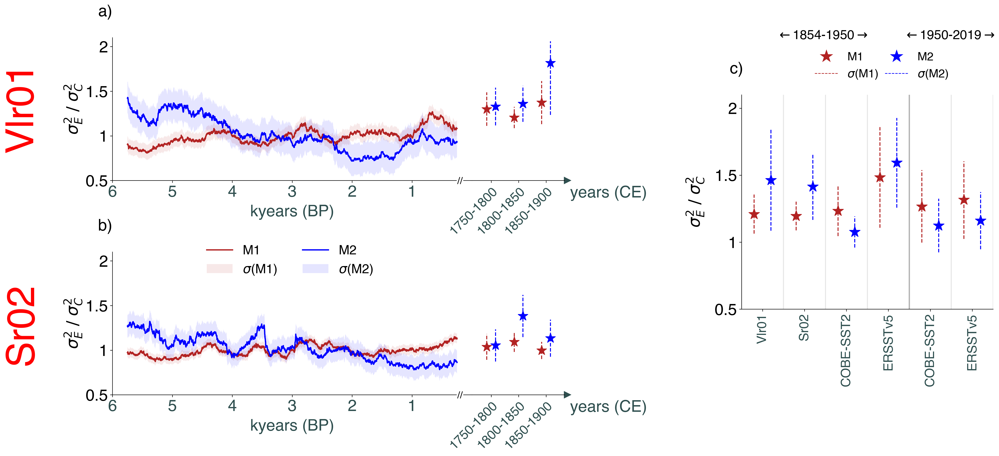

In [77]:
projection=ccrs.Orthographic(central_longitude=230,central_latitude=0)
c='gray'

X = np.linspace(-6,0,6000)

ind_Vlr01 = np.argwhere(E_Vlr01.values >= 2)
ind_Sr02 = np.argwhere(E_Sr02.values >= 2)
ind_Vlr01_ = np.argwhere(E_Vlr01_.values >= 2)
ind_Sr02_ = np.argwhere(E_Sr02_.values >= 2)

hatch_style='...'

alpha=.1

plt.rcParams['xtick.labelsize']=25
plt.rcParams['ytick.labelsize']=25

fig, (ax1,ax2) = plt.subplots(2,1,figsize=(10,10), gridspec_kw=dict(hspace=0.5))

######################################################################################
##############################        Vlr01       ####################################
######################################################################################

ax1.plot(X,R_Vlr01.values,linewidth=2,color='firebrick')

l = ax1.fill_between(X, R_Vlr01.values - boot_Vlr01[0], R_Vlr01.values + boot_Vlr01[1], 
                 alpha=.1,facecolor='firebrick',label='error')


######################################################################################
##############################        Vlr01_        ####################################
######################################################################################

ax1.plot(X,R_Vlr01_.values,linewidth=2,color='blue')

ax1.fill_between(X, R_Vlr01_.values - boot_Vlr01_[0], R_Vlr01_.values + boot_Vlr01_[1], 
                 alpha=.1,facecolor='blue',label='error')


######################################################################################
##############################        Sr02        ####################################
######################################################################################

ax2.plot(X,R_Sr02.values,linewidth=2,color='firebrick',label='M1')

ax2.fill_between(X, R_Sr02.values - boot_Sr02[0], R_Sr02.values + boot_Sr02[1], 
                 alpha=.1,facecolor='firebrick',label=r'$\sigma$(M1)')


######################################################################################
##############################        Sr02_        ###################################
######################################################################################

ax2.plot(X,R_Sr02_.values,linewidth=2,color='blue',label='M2')

ax2.fill_between(X, R_Sr02_.values - boot_Sr02_[0], R_Sr02_.values + boot_Sr02_[1], 
                 alpha=.1,facecolor='blue',label=r'$\sigma$(M2)')


sz=15

axs = [ax1,ax2]
axs_total = [ax1,ax2]

axs_total = [ax1,ax2]
names = ['a)','b)']

################################################################

axs_method = [ax1, ax2]

for n in axs_method:
    if n == ax1:
        n.text(-.25, .25, r"Vlr01", size=60, color='red', rotation='vertical', fontweight='bold',ha="center", \
             transform=n.transAxes)
    if n == ax2:
        n.text(-.25, .26, r"Sr02", size=60, color='red', rotation='vertical', fontweight='bold',ha="center", \
             transform=n.transAxes)
        
#####################

data_Vlr01 = {}
data_Sr02 = {}

####

n = 10

data_Vlr01['Vlr01_1_ER'] = (E_C_Vlr01.E[5750:5799].rolling(year=n,center=True).var()/\
E_C_Vlr01.C[5750:5799].rolling(year=n,center=True).var()).values[5:-5]
data_Vlr01['Vlr01_1_AM'] = (E_C_Vlr01.E_[5750:5799].rolling(year=n,center=True).var()/\
E_C_Vlr01.C_[5750:5799].rolling(year=n,center=True).var()).values[5:-5]

data_Sr02['Sr02_1_ER'] = (E_C_Sr02.E[5750:5799].rolling(year=n,center=True).var()/\
E_C_Sr02.C[5750:5799].rolling(year=n,center=True).var()).values[5:-5]
data_Sr02['Sr02_1_AM'] = (E_C_Sr02.E_[5750:5799].rolling(year=n,center=True).var()/\
E_C_Sr02.C_[5750:5799].rolling(year=n,center=True).var()).values[5:-5]

####

data_Vlr01['Vlr01_2_ER'] = (E_C_Vlr01.E[5800:5849].rolling(year=n,center=True).var()/\
E_C_Vlr01.C[5800:5849].rolling(year=n,center=True).var()).values[5:-5]
data_Vlr01['Vlr01_2_AM'] = (E_C_Vlr01.E_[5800:5849].rolling(year=n,center=True).var()/\
E_C_Vlr01.C_[5800:5849].rolling(year=n,center=True).var()).values[5:-5]

data_Sr02['Sr02_2_ER'] = (E_C_Sr02.E[5800:5849].rolling(year=n,center=True).var()/\
E_C_Sr02.C[5800:5849].rolling(year=n,center=True).var()).values[5:-5]
data_Sr02['Sr02_2_AM'] = (E_C_Sr02.E_[5800:5849].rolling(year=n,center=True).var()/\
E_C_Sr02.C_[5800:5849].rolling(year=n,center=True).var()).values[5:-5]

####

data_Vlr01['Vlr01_3_ER'] = (E_C_Vlr01.E[5850:5899].rolling(year=n,center=True).var()/\
E_C_Vlr01.C[5850:5899].rolling(year=n,center=True).var()).values[5:-5]
data_Vlr01['Vlr01_3_AM'] = (E_C_Vlr01.E_[5850:5899].rolling(year=n,center=True).var()/\
E_C_Vlr01.C_[5850:5899].rolling(year=n,center=True).var()).values[5:-5]

data_Sr02['Sr02_3_ER'] = (E_C_Sr02.E[5850:5899].rolling(year=n,center=True).var()/\
E_C_Sr02.C[5850:5899].rolling(year=n,center=True).var()).values[5:-5]
data_Sr02['Sr02_3_AM'] = (E_C_Sr02.E_[5850:5899].rolling(year=n,center=True).var()/\
E_C_Sr02.C_[5850:5899].rolling(year=n,center=True).var()).values[5:-5]

####

data_Vlr01['Vlr01_4_ER'] = (E_C_Vlr01.E[5900:5949].rolling(year=n,center=True).var()/\
E_C_Vlr01.C[5900:5949].rolling(year=n,center=True).var()).values[5:-5]
data_Vlr01['Vlr01_4_AM'] = (E_C_Vlr01.E_[5900:5949].rolling(year=n,center=True).var()/\
E_C_Vlr01.C_[5900:5949].rolling(year=n,center=True).var()).values[5:-5]

data_Sr02['Sr02_4_ER'] = (E_C_Sr02.E[5900:5949].rolling(year=n,center=True).var()/\
E_C_Sr02.C[5900:5949].rolling(year=n,center=True).var()).values[5:-5]
data_Sr02['Sr02_4_AM'] = (E_C_Sr02.E_[5900:5949].rolling(year=n,center=True).var()/\
E_C_Sr02.C_[5900:5949].rolling(year=n,center=True).var()).values[5:-5]

####

names_Vlr01 = ['Vlr01_2_ER','Vlr01_2_AM',\
              'Vlr01_3_ER','Vlr01_3_AM',
              'Vlr01_4_ER','Vlr01_4_AM']

names_Sr02 = ['Sr02_2_ER','Sr02_2_AM',\
              'Sr02_3_ER','Sr02_3_AM',
             'Sr02_4_ER','Sr02_4_AM']


offset = 8
values_ = [X[5825-offset],X[5825+offset],
         X[5875-offset],X[5875+offset],
         X[5925-offset],X[5925+offset]]

color_=['firebrick','blue']*len(values_)

conf = '95%'
N= 10000

plt1 = inset_axes(ax1, 
               width=2,   
               height=3,
               loc='lower left',
               bbox_to_anchor=(1, 0, 1, 1),
               bbox_transform=ax1.transAxes,
               borderpad=0,
               )

for name,val,col in zip(names_Vlr01,values_,color_):
    plt1.scatter(val, np.nanmean(data_Vlr01[name]), s=250, c=col, marker='*')
    plt1.plot([val,val],[bootstrap_sample(data_Vlr01[name],'mean',N,conf)[0],\
                           bootstrap_sample(data_Vlr01[name],'mean',N,conf)[1]],col,linestyle='--')
  

plt2 = inset_axes(ax2, 
               width=2,  
               height=3,
               loc='lower left',
               bbox_to_anchor=(1, 0, 1, 1),
               bbox_transform=ax2.transAxes,
               borderpad=0,
               )

    
for name,val,col in zip(names_Sr02,values_,color_):
    plt2.scatter(val, np.nanmean(data_Sr02[name]), s=250, c=col, marker='*')
    plt2.plot([val,val],[bootstrap_sample(data_Sr02[name],'mean',N,conf)[0],\
                           bootstrap_sample(data_Sr02[name],'mean',N,conf)[1]],col,linestyle='--')


axis = [plt1,plt2]
    
for ax in axis:
    

    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
    ax.set_ylim(0.5,2.1)
    ax.set_yticks([])
    
    ax.set_xlim(X[5800-10],X[5959])
    ax.set_xticks([X[5825], X[5875],X[5925]])
    ax.set_xticklabels(['1750-1800', '1800-1850', '1850-1900'], rotation = 45, \
                       ha='right',rotation_mode='anchor', fontsize=20,color='darkslategray')
    
    ax.plot((X[5959])+0.005, (0), ls="", marker=">", ms=10, color="darkslategray",
            transform=ax.get_xaxis_transform(), clip_on=False)
    
###################

for ax,name in zip(axs_total,names):
    
    ax.text(-.02, 1.15, name, size=25,color='black', ha="center", 
             transform=ax.transAxes)
    ax.text(1.38, -.118, 'years (CE)', size=25, color='darkslategray', ha="center", 
         transform=ax.transAxes)
    
    ax.text(0.5, -0.25, 'kyears (BP)', size=25, color='darkslategray', ha="center", 
         transform=ax.transAxes)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    ax.set_xlim(-6,0)
    ax.set_xticks([-6,-5,-4,-3,-2,-1
                   ])
    ax.set_xticklabels([6,5,4,3,2,1
                        ], color='darkslategray')
    
    ax.scatter(-0.2, 0. +0.5, color='white', marker='s', s=80, clip_on=False, zorder=100)
    ax.text(-0.2, 0.-0.01 +0.5, r'//', fontsize=15, \
            zorder=101, horizontalalignment='center', verticalalignment='center')



    ax.set_ylim(0.5,2.1)
    ax.set_yticks([0.5,1,1.5,2])
    ax.set_yticklabels(['0.5','1','1.5','2'])

    ax.set_ylabel(r'$\sigma^{2}_{E}$ $/$ $\sigma^{2}_{C}$',fontsize=25)
        
ax2.legend(loc='lower left', fontsize=20,
             bbox_to_anchor=(0.23, 0.75),fancybox=False, shadow=False,frameon=False, ncol=2)
    
#################################################################

width = "70%"
height = "150%"
x=1.75
y=.6

ax2bis = inset_axes(ax2,  
               width=width,   
               height=height,
               loc='lower left',
               bbox_to_anchor=(x, y, 1, 1),
               bbox_transform=ax2.transAxes,
               borderpad=0,
               )

n = 10
s= 100

#####################

#boot_Vlr01_1854_1950
x1 = (E_Vlr01_1854_1950[:,0,0].rolling(year=n,center=True).var()/\
C_Vlr01_1854_1950[:,0,0].rolling(year=n,center=True).var()).values
   
#boot_Vlr01_1854_1950_ 
x2 = (E_Vlr01_1854_1950_.rolling(year=n,center=True).var()/\
C_Vlr01_1854_1950_.rolling(year=n,center=True).var()).values


#####################

#boot_Sr02_1854_1950
x3 = (E_Sr02_1854_1950[:,0,0].rolling(year=n,center=True).var()/\
C_Sr02_1854_1950[:,0,0].rolling(year=n,center=True).var()).values

#boot_Sr02_1854_1950_ 
x4 = (E_Sr02_1854_1950_.rolling(year=n,center=True).var()/\
C_Sr02_1854_1950_.rolling(year=n,center=True).var()).values

#####################

#boot_cobe_sst2_1854_1950 
x5 = (E_cobe_sst2_1854_1950[:,0,0].rolling(year=n,center=True).var()/\
C_cobe_sst2_1854_1950[:,0,0].rolling(year=n,center=True).var()).values

#boot_cobe_sst2_1854_1950_ 
x6 = (E_cobe_sst2_1854_1950_.rolling(year=n,center=True).var()/\
C_cobe_sst2_1854_1950_.rolling(year=n,center=True).var()).values

#####################

#boot_ERSSTv5_1854_1950 
x7 = (E_ERSSTv5_1854_1950[:,0,0].rolling(year=n,center=True).var()/\
C_ERSSTv5_1854_1950[:,0,0].rolling(year=n,center=True).var()).values

#boot_ERSSTv5_1854_1950_ 
x8 = (E_ERSSTv5_1854_1950_.rolling(year=n,center=True).var()/\
C_ERSSTv5_1854_1950_.rolling(year=n,center=True).var()).values

#####################

#boot_cobe_sst2_1950_2019 
x9 = (E_cobe_sst2_1950_2019[:,0,0].rolling(year=n,center=True).var()/\
C_cobe_sst2_1950_2019[:,0,0].rolling(year=n,center=True).var()).values

#boot_cobe_sst2_1950_2019_
x10 = (E_cobe_sst2_1950_2019_.rolling(year=n,center=True).var()/\
C_cobe_sst2_1950_2019_.rolling(year=n,center=True).var()).values

#####################

#boot_ERSSTv5_1950_2019 
x11 = (E_ERSSTv5_1950_2019[:,0,0].rolling(year=n,center=True).var()/\
C_ERSSTv5_1950_2019[:,0,0].rolling(year=n,center=True).var()).values

#boot_ERSSTv5_1950_2019_ 
x12 = (E_ERSSTv5_1950_2019_.rolling(year=n,center=True).var()/\
C_ERSSTv5_1950_2019_.rolling(year=n,center=True).var()).values

#####################

data = {}
data['Vlr01_1'] = x1[5:-5]
data['Vlr01_2'] = x2[5:-5]
data['Sr02_1'] = x3[5:-5]
data['Sr02_2'] = x4[5:-5]
data['COBE-SST2_1'] = x5[5:-5]
data['COBE-SST2_2'] = x6[5:-5]
data['ERSSTv5_1'] = x7[5:-5]
data['ERSSTv5_2'] = x8[5:-5]
data['COBE-SST2_3'] = x9[5:-5]
data['COBE-SST2_4'] = x10[5:-5]
data['ERSSTv5_5'] = x11[5:-5]
data['ERSSTv5_6'] = x12[5:-5]

names = ['Vlr01_1','Vlr01_2','Sr02_1','Sr02_2',\
         'COBE-SST2_1','COBE-SST2_2','ERSSTv5_1','ERSSTv5_2',\
        'COBE-SST2_3','COBE-SST2_4','ERSSTv5_5','ERSSTv5_6']


values = [0.8,1.2, 1.8,2.2, \
                      2.8,3.2, 3.8,4.2,\
                     4.8,5.2, 5.8,6.2]

color=['firebrick','blue']*len(values)

conf = '95%'
N= 10000

for name,val,col in zip(names,values,color):
    ax2bis.scatter(val, np.nanmean(data[name]), s=300, c=col, marker='*')
    ax2bis.plot([val,val],[bootstrap_sample(data[name],'mean',N,conf)[0],\
                           bootstrap_sample(data[name],'mean',N,conf)[1]],col,linestyle='--')
    

#####################

ax2bis.axvline(0.5, color='k', alpha=0.1)
ax2bis.axvline(1.5, color='k', alpha=0.1)
ax2bis.axvline(2.5, color='k', alpha=0.1)
ax2bis.axvline(3.5, color='k', alpha=0.1)

ax2bis.axvline(4.5, color='k', alpha=0.3,linewidth=2)

ax2bis.axvline(5.5, color='k', alpha=0.1)
ax2bis.axvline(6.5, color='k', alpha=0.1)

ax2bis.spines['right'].set_visible(False)
ax2bis.spines['top'].set_visible(False)

ax2bis.set_xlim(0.5,6.5)

ax2bis.set_ylim(0.5,2.1)
ax2bis.set_yticks([0.5,1,1.5,2])
ax2bis.set_yticklabels(['0.5','1','1.5','2'])

ax2bis.set_xticks([1,2,3,4,5,6])
ax2bis.set_xticklabels(['Vlr01','Sr02','COBE-SST2','ERSSTv5','COBE-SST2','ERSSTv5'], fontsize=20,\
                       color='darkslategray')

plt.xticks(rotation = 90)

ax2bis.text(-.02, 1.1, 'c)', size=25,color='black', ha="center", 
             transform=ax2bis.transAxes)

ax2bis.text(0.32, 1.26, r'$\leftarrow$1854-1950$\rightarrow$', size=20,color='black', ha="center", 
             transform=ax2bis.transAxes)

ax2bis.text(0.825, 1.26, r'$\leftarrow$1950-2019$\rightarrow$', size=20,color='black', ha="center", 
             transform=ax2bis.transAxes)

ax2bis.set_ylabel(r'$\sigma^{2}_{E}$ $/$ $\sigma^{2}_{C}$',fontsize=25,labelpad=15)


legend_elements = [Line2D([0], [0], marker='*', color='w', label='M1',
                          markerfacecolor='firebrick', markersize=25),
                   
                   Line2D([0], [0], color='firebrick', lw=1, linestyle='--', label=r'$\sigma$(M1)'),
                   
                   Line2D([0], [0], marker='*', color='w', label='M2',
                          markerfacecolor='blue', markersize=25),
                   Line2D([0], [0], color='blue', lw=1, linestyle='--',label=r'$\sigma$(M2)')
                   ]

ax2bis.legend(handles=legend_elements,loc='lower left', fontsize=18,
             bbox_to_anchor=(0.25, 1.02),fancybox=False, shadow=False,frameon=False, ncol=2, columnspacing=0.6)



## Figure 2

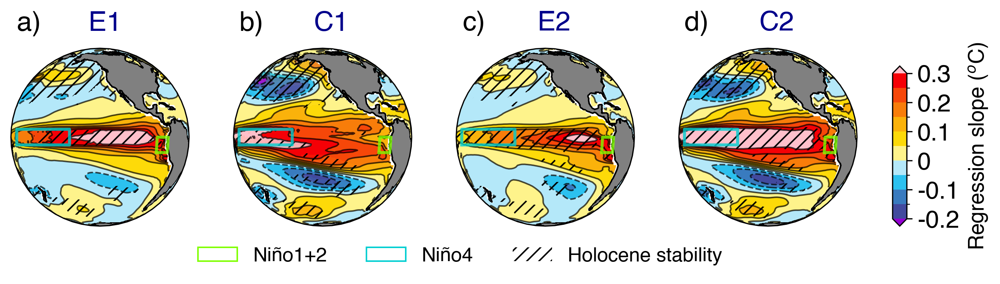

In [78]:
projection=ccrs.Orthographic(central_longitude=230,central_latitude=0)
c='gray'

hatch_style='///'

alpha=.1

plt.rcParams['xtick.labelsize']=16
plt.rcParams['ytick.labelsize']=16

min_=-0.2
max_=0.3

levels = [-0.2,-0.15,-0.1,-0.05,0,0.05,0.10,0.15,0.20,0.25,0.3]

my_colors = ['#424A9E','#397BBF','#2CC1EF','#B4E8F9',
             '#FEF38B','#FDDA09','#FAB20B','#F87D0A','#F64709','#F50006']

cmap = ListedColormap(sns.color_palette(my_colors).as_hex())

cmap.set_over('pink')
cmap.set_under('darkviolet')

norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=10)


fig, (ax1,ax2,ax3,ax4) = plt.subplots(1,4,figsize=(10,10),
                                                                   subplot_kw=dict(projection=projection),
                                                                  gridspec_kw=dict(hspace=.4,wspace=.25,
                                                                                  #left=.15,right=.55,
                                                                                  top=.6,bottom=.08))

mean=1.25

######################################################################################
##############################        Vlr01       ####################################
######################################################################################

ax1.set_global()
ax1.coastlines()
ax1.add_feature(cfeature.LAND,color=c)

im1 = regress.regE_Sr02.plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                            #vmin=min_,vmax=max_,
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax1.contour(im1,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())


xr.where((regs_Sr02.E_reg.std(dim='num')/regs_Sr02.E_reg.std(dim='num').sum()*100)>(regs_Sr02.E_reg.std(dim='num')/regs_Sr02.E_reg.std(dim='num').sum()*100).mean()*mean,regress.regE_Sr02,np.nan).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                             #vmin=min_,vmax=max_,
                                                        hatches=[hatch_style],alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax2.set_global()
ax2.coastlines()
ax2.add_feature(cfeature.LAND,color=c)

im2 = regress.regC_Sr02.plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                            #vmin=min_,vmax=max_,
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax2.contour(im2,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

xr.where((regs_Sr02.C_reg.std(dim='num')/regs_Sr02.C_reg.std(dim='num').sum()*100)>(regs_Sr02.C_reg.std(dim='num')/regs_Sr02.C_reg.std(dim='num').sum()*100).mean()*mean, regress.regE_Sr02, np.nan).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                             #vmin=min_,vmax=max_,
                                                        hatches=[hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################
##############################        Vlr01_        ####################################
######################################################################################

ax3.set_global()
ax3.coastlines()
ax3.add_feature(cfeature.LAND,color=c)

im3 = regress.regE_Sr02_.plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                            #vmin=min_,vmax=max_,
                              cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax3.contour(im3,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

xr.where((regs_Sr02.E_reg_.std(dim='num')/regs_Sr02.E_reg_.std(dim='num').sum()*100)>(regs_Sr02.E_reg_.std(dim='num')/regs_Sr02.E_reg_.std(dim='num').sum()*100).mean()*mean,regress.regE_Sr02_,np.nan).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                               #vmin=min_,vmax=max_,
                                                        hatches=[hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax4.set_global()
ax4.coastlines()
ax4.add_feature(cfeature.LAND,color=c)

im4 = regress.regC_Sr02_.plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                            #vmin=min_,vmax=max_,
                              cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax4.contour(im4,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

xr.where((regs_Sr02.C_reg_.std(dim='num')/regs_Sr02.C_reg_.std(dim='num').sum()*100)>(regs_Sr02.C_reg_.std(dim='num')/regs_Sr02.C_reg_.std(dim='num').sum()*100).mean()*mean,regress.regC_Sr02_,np.nan).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                               #vmin=min_,vmax=max_,
                                                        hatches=[hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

sz=15

x1, y2 = [270, 270, 280, 280, 270], [-10, 0, 0, -10, -10]

x3, y4 = [160, 160, 210, 210, 160], [-5, 5, 5, -5, -5]

axs = [ax1,ax2,ax3,ax4]

for ax in axs :
    ax.plot(x1, y2, color='chartreuse', linewidth = 2., transform=ccrs.PlateCarree(),alpha=.8)
    ax.plot(x3, y4, color='darkturquoise', linewidth = 2., transform=ccrs.PlateCarree(),alpha=.8)
    
    if ax==ax1:
        ax.text(.55, 1.1, r"E1 ", size=18, fontweight='bold',ha="center", color='darkblue',
             transform=ax.transAxes)
        
    if ax==ax2:
        ax.text(.55, 1.1, r"C1", size=18, fontweight='bold',ha="center", color='darkblue',
             transform=ax.transAxes)
        
    if ax==ax3:
        ax.text(.55, 1.1, r"E2", size=18, fontweight='bold',ha="center", color='darkblue',
             transform=ax.transAxes)
        
    if ax==ax4:
        ax.text(.55, 1.1, r"C2", size=18, fontweight='bold',ha="center", color='darkblue',
             transform=ax.transAxes)

axs_total = [ax1,ax2,ax3,ax4]
names = ['a)','b)','c)','d)']

for ax,name in zip(axs_total,names):
    
    ax.text(.1, 1.1, name, size=18, color='black', ha="center", 
             transform=ax.transAxes)


###################################   Colorbar   ######################################

cb_ax = inset_axes(ax4,  
               width="8%",   
               height="90%",
               loc='lower left',
               bbox_to_anchor=(1.2, 0, 1, 1),
               bbox_transform=ax4.transAxes,
               borderpad=0,
               )

cb = fig.colorbar(im1,cax=cb_ax,norm=norm,cmap=cmap,ticks=levels[::2],
                  orientation='vertical',
                  extend='both',pad=0.1,fraction=0.5,aspect=5)


cb.ax.set_ylabel(r'Regression slope ($^o$C)', fontsize=14, labelpad=5,rotation=90.)
cb.ax.tick_params(labelsize=16)
cb.ax.yaxis.set_ticks(levels,minor=True)
cb.ax.set_yticklabels([r'-0.2', r'-0.1','0','0.1','0.2','0.3'])


legend_elements = [Patch(facecolor='white', edgecolor='chartreuse',
                         label=r'Niño1+2'),Patch(facecolor='white', edgecolor='darkturquoise',
                         label=r'Niño4'),Patch(facecolor='white',alpha=.6,hatch=hatch_style,
                         label=r'Holocene stability')]

ax2.legend(handles=legend_elements, loc='lower left', fontsize=13, ncol=3,
             bbox_to_anchor=(-.3, -0.32),fancybox=False, shadow=False,frameon=False)

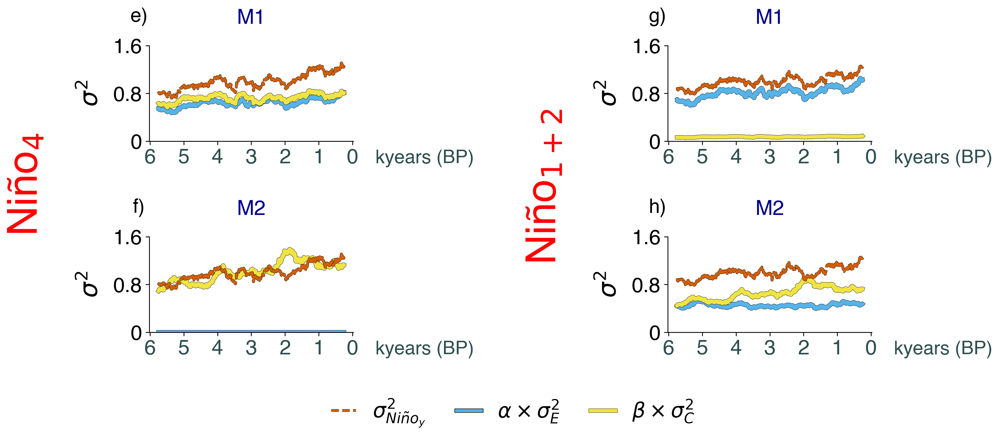

In [79]:
roll=500

plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

red = '#D55E00'
blue = '#56B4E9'
green = '#F0E442'

heights = [1,1]

fig = plt.figure(figsize=(17,5))  

gs = gridspec.GridSpec(ncols=4, nrows=2, figure=fig, height_ratios=heights)


gs.update(wspace=0.27, hspace=1.)

# Line plots 
ax5 = fig.add_subplot(gs[0,0:1]); ax7 = fig.add_subplot(gs[0,2:3]);
ax6 = fig.add_subplot(gs[1,0:1]); ax8 = fig.add_subplot(gs[1,2:3]); 

#
############# ax5

(reg_CP_Sr02.coef_[0]*E_Sr02.rolling(year=roll,center=True).var()).plot(ax=ax5,
                                                                         color=blue,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

(reg_CP_Sr02.coef_[1]*C_Sr02.rolling(year=roll,center=True).var()).plot(ax=ax5,
                                                                          color=green,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

standardise(sel_szn(nino4_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=roll,center=True).var().plot(ax=ax5,color=red,alpha=1,linewidth=2,
                                                                   linestyle='--',path_effects=[pe.Stroke(linewidth=2.5, foreground='k'), pe.Normal()])

############# ax6

(reg_CP_Sr02_.coef_[0]*E_Sr02_.rolling(year=roll,center=True).var()).plot(ax=ax6,
                                                                         color=blue,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

(reg_CP_Sr02_.coef_[1]*C_Vlr01_.rolling(year=roll,center=True).var()).plot(ax=ax6,
                                                                          color=green,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

standardise(sel_szn(nino4_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=roll,center=True).var().plot(ax=ax6,color=red,alpha=1,linewidth=2,
                                                                   linestyle='--',path_effects=[pe.Stroke(linewidth=2.5, foreground='k'), pe.Normal()])
############# ax7

(reg_EP_Sr02.coef_[0]*E_Sr02.rolling(year=roll,center=True).var()).plot(ax=ax7,
                                                                         color=blue,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

(reg_EP_Sr02.coef_[1]*C_Sr02.rolling(year=roll,center=True).var()).plot(ax=ax7,
                                                                          color=green,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

standardise(sel_szn(nino12_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=roll,center=True).var().plot(ax=ax7,color=red,alpha=1,linewidth=2,
                                                                   linestyle='--',path_effects=[pe.Stroke(linewidth=2.5, foreground='k'), pe.Normal()])

############# ax8

(reg_EP_Sr02_.coef_[0]*E_Vlr01_.rolling(year=roll,center=True).var()).plot(ax=ax8,
                                                                         color=blue,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

(reg_EP_Sr02_.coef_[1]*C_Vlr01_.rolling(year=roll,center=True).var()).plot(ax=ax8,
                                                                          color=green,linewidth=3.5,alpha=1,path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()])

standardise(sel_szn(nino12_Sr02.tos.mean(dim=('lat','lon')),'time_counter')).rolling(year=roll,center=True).var().plot(ax=ax8,color=red,alpha=1,linewidth=2,
                                                                   linestyle='--',path_effects=[pe.Stroke(linewidth=2.5, foreground='k'), pe.Normal()])

###########

axs_sci = [ax5,ax6,ax7,ax8]

for j in axs_sci:
    
    j.spines['right'].set_visible(False)
    j.spines['top'].set_visible(False)
    j.spines['bottom'].set_visible(True)
    
    j.set_xticks([2000,3000,4000,5000,6000,7000,8000])
    
    j.set_xticklabels(['6','5','4','3','2','1','0'], color='darkslategray')
    j.set_xlabel('')
    
    j.set_ylim(0,1.6)
    
    j.set_yticks([0,0.8,1.6])
    j.set_yticklabels(['0','0.8','1.6'])
    
    j.set_ylabel(r'$\sigma^{2}$',fontsize=24,labelpad=10)
    
    j.text(1.35,-0.23, r"kyears (BP)", size=18.25, color='darkslategray', ha="center", fontweight='bold',
             transform=j.transAxes)
        
        
#############

for n in axs_sci:
    if (n == ax5) or (n == ax7):
        n.text(0.5, 1.23, "M1", size=20, color='darkblue', rotation='horizontal', fontweight='bold',ha="center", 
             transform=n.transAxes)
    elif (n == ax6) or (n == ax8):
        n.text(0.5, 1.23, "M2", size=20, color='darkblue', rotation='horizontal', fontweight='bold',ha="center", 
             transform=n.transAxes)
    if n == ax6:
        n.text(-.6, 1.1, r"Niño$_{4}$", size=40, color='red', rotation='vertical', fontweight='bold',ha="center", 
             transform=n.transAxes)
    if n == ax8:
        n.text(-.6, .8, r"Niño$_{1+2}$", size=40, color='red', rotation='vertical', fontweight='bold',ha="center", 
             transform=n.transAxes)
        
#############

names1 = ['e)','f)','g)','h)']

for ax,name in zip(axs_sci,names1):
    
    ax.text(-0.05,1.25, name, size=19, fontweight='bold',ha="center", 
             transform=ax.transAxes)

#############

legend_elements_reg = [mlines.Line2D([], [], color = red, linestyle='--',
                          linewidth=2, alpha=1, path_effects=[pe.Stroke(linewidth=2.5, foreground='k'), pe.Normal()], 
                                     label=r'$\sigma^{2}_{Ni\tilde{n}o_{y}}$'),
                  mlines.Line2D([], [], color = blue, linestyle='-',path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()],
                          linewidth=3, alpha=1, label=r'$\alpha\times \sigma^{2}_{E}$'),
                  mlines.Line2D([], [], color = green, path_effects=[pe.Stroke(linewidth=4, foreground='k'), pe.Normal()], linestyle='-',
                          linewidth=3.5, alpha=1, label=r'$\beta\times \sigma^{2}_{C}$')]

ax6.legend(handles=legend_elements_reg, ncol=3, loc='lower left', fontsize=20, 
             bbox_to_anchor=(.8, -1.2),fancybox=False, shadow=False,frameon=False, 
            handlelength=1.2, columnspacing=1.5)


## Figure 3 

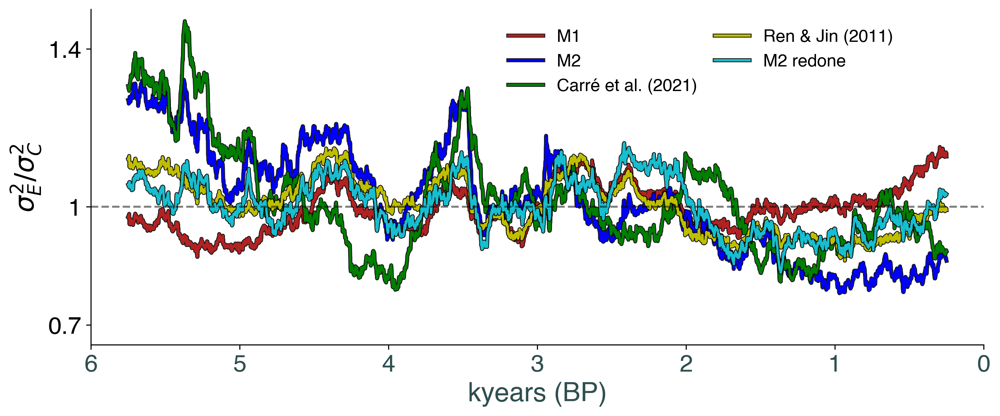

In [80]:
plt.figure(figsize=(12,10))

plt.subplot(211)

width=1.75
path_effects=[pe.Stroke(linewidth=3, foreground='black',alpha=.9), pe.Normal()]

R_Sr02.plot(color='firebrick',label='M1',linewidth=width,path_effects=path_effects)
R_Sr02_.plot(color='blue',label='M2',linewidth=width,path_effects=path_effects)
R_Carre_Sr02.plot(color='g',label='Carré et al. (2021)',linewidth=width,path_effects=path_effects)
R_Sr02_rj.plot(color='y',label='Ren & Jin (2011)',linewidth=width,path_effects=path_effects)
R_Sr02_bis.plot(color='tab:cyan',linewidth=width,label='M2 redone',path_effects=path_effects)

plt.ylabel(r'$\sigma^2_E/\sigma^2_C$',fontsize=20)
plt.ylim(0.65,1.5)
plt.yticks([0.7,1,1.4],['0.7','1','1.4'],fontsize=18)

plt.xlim(2000,8000)
plt.xticks([2000,3000,4000,5000,6000,7000,8000],['6','5','4','3','2','1','0'],fontsize=18,color='darkslategray')

plt.xlabel('kyears (BP)', fontsize=20, color='darkslategray')

plt.axhline(y=1, color="black", linestyle="--", alpha = 0.5)

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

plt.legend(loc='lower left', fontsize=13, 
             bbox_to_anchor=(.45, 0.7),fancybox=False, 
           shadow=False,frameon=False, ncol=2, columnspacing=1)

## Figure S1

(0.0, 6.0)

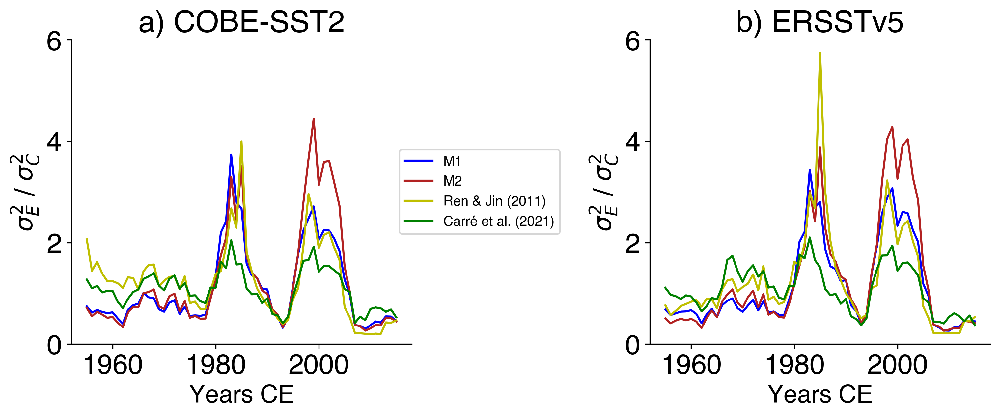

In [81]:
plt.figure(figsize=(12,4))

ax = plt.subplot(121)

roll=10

(E_cobe_sst2_1950_2019_.rolling(year=roll,center=True).var()/C_cobe_sst2_1950_2019_.rolling(year=roll,center=True).var()).plot(color='blue')

(E_cobe_sst2_1950_2019.rolling(year=roll,center=True).var()/C_cobe_sst2_1950_2019.rolling(year=roll,center=True).var()).plot(color='firebrick')

(E_cobe_sst2_1950_2019_rj.rolling(year=roll,center=True).var()/C_cobe_sst2_1950_2019_rj.rolling(year=roll,center=True).var()).plot(color='y',label='Ren & Jin (2011)')

variance_ratio(cobe_sst2_1950_2019.sel(lat=slice(-20,-8),lon=slice(278,290)).sst.mean(dim=('lat','lon')),\
    cobe_sst2_1950_2019.sel(lat=slice(0,8),lon=slice(194,206)).sst.mean(dim=('lat','lon')),'time','yes',10).plot(color='g',label='Carré et al. (2021)')

plt.ylabel(r'$\sigma^{2}_{E}$ $/$ $\sigma^{2}_{C}$',fontsize=18)

plt.xlabel(r'Years CE',fontsize=18)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

plt.title('a) COBE-SST2',fontsize=22)

ax1 = plt.subplot(122)

(E_ERSSTv5_1950_2019_.rolling(year=roll,center=True).var()/C_ERSSTv5_1950_2019_.rolling(year=roll,center=True).var()).plot(color='blue',label='M1')

(E_ERSSTv5_1950_2019.rolling(year=roll,center=True).var()/C_ERSSTv5_1950_2019.rolling(year=roll,center=True).var()).plot(color='firebrick',label='M2')

(E_ERSSTv5_1950_2019_rj.rolling(year=roll,center=True).var()/C_ERSSTv5_1950_2019_rj.rolling(year=roll,center=True).var()).plot(color='y',label='Ren & Jin (2011)')

variance_ratio(ERSSTv5_1950_2019.sel(lat=slice(-20,-8),lon=slice(278,290)).sst.mean(dim=('lat','lon')),\
    ERSSTv5_1950_2019.sel(lat=slice(0,8),lon=slice(194,206)).sst.mean(dim=('lat','lon')),'time','yes',10).plot(color='g',label='Carré et al. (2021)')


ax1.set_ylabel(r'$\sigma^{2}_{E}$ $/$ $\sigma^{2}_{C}$',fontsize=18)

ax1.set_xlabel(r'Years CE',fontsize=18)

ax1.legend(bbox_to_anchor=[-0.5, 0.5], loc='center')

ax1.spines['right'].set_visible(False)
ax1.spines['top'].set_visible(False)

plt.title('b) ERSSTv5',fontsize=22)

plt.subplots_adjust(wspace=0.7)

ax1.set_ylim(0,6)
ax.set_ylim(0,6)

## Figure S2

Text(0.53, 0.64, 'Regression patterns \n 1950-2019 C.E.')

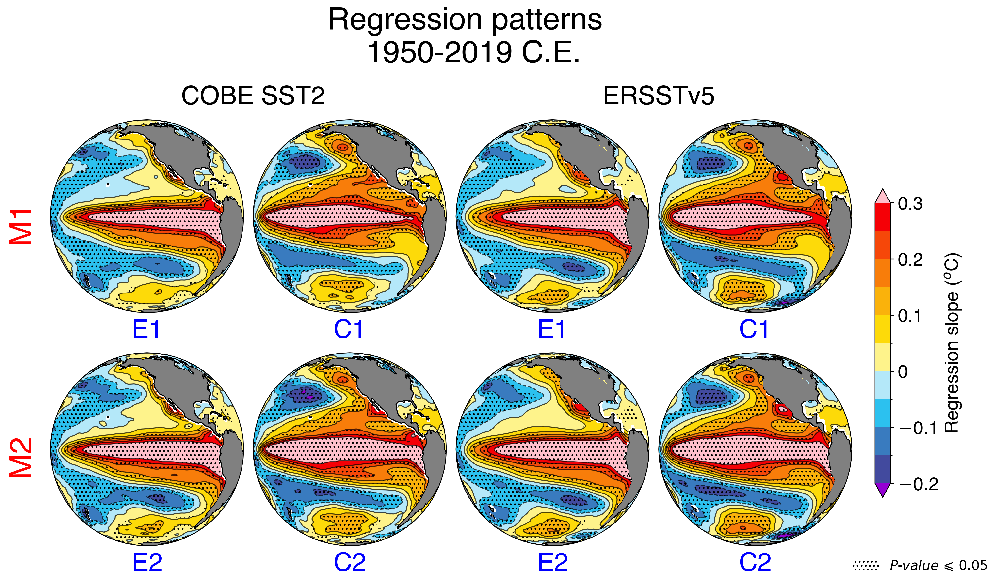

In [82]:
projection=ccrs.Orthographic(central_longitude=230,central_latitude=0)
c='gray'

hatch_style='...'

alpha=.1

min_=-0.2
max_=0.3

levels = [-0.2,-0.15,-0.1,-0.05,0,0.05,0.10,0.15,0.20,0.25,0.3]

my_colors = ['#424A9E','#397BBF','#2CC1EF','#B4E8F9',
             '#FEF38B','#FDDA09','#FAB20B','#F87D0A','#F64709','#F50006']
cmap = ListedColormap(sns.color_palette(my_colors).as_hex())

cmap.set_over('pink')
cmap.set_under('darkviolet')

norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=10)


fig = plt.figure(figsize=(14, 14)) 
gs = gridspec.GridSpec(ncols=4, nrows=2, figure=fig)

gs.update(wspace=0.05, hspace=0.005, bottom=0.1, top=0.55)

ax1 = fig.add_subplot(gs[0,0],projection=projection); ax2 = fig.add_subplot(gs[0,1],projection=projection); ax11 = fig.add_subplot(gs[0,2],projection=projection); ax22 = fig.add_subplot(gs[0,3],projection=projection);
ax3 = fig.add_subplot(gs[1,0],projection=projection); ax4 = fig.add_subplot(gs[1,1],projection=projection); ax33 = fig.add_subplot(gs[1,2],projection=projection); ax44 = fig.add_subplot(gs[1,3],projection=projection);

######################################################################################
############################        COBE SST2       ##################################
######################################################################################

ax1.set_global()
ax1.coastlines()
ax1.add_feature(cfeature.LAND,color=c)

im = reg_cobe_sst2.regE_1950_2019.plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax1.contour(im,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regE_1950_2019.where(reg_cobe_sst2.regE_1950_2019_pval<=0.05).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax2.set_global()
ax2.coastlines()
ax2.add_feature(cfeature.LAND,color=c)

im2 = reg_cobe_sst2.regC_1950_2019.plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax2.contour(im2,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regC_1950_2019.where(reg_cobe_sst2.regC_1950_2019_pval<=0.05).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax3.set_global()
ax3.coastlines()
ax3.add_feature(cfeature.LAND,color=c)

im3 = reg_cobe_sst2.regE_1950_2019_.plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax3.contour(im3,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regE_1950_2019_.where(reg_cobe_sst2.regE_1950_2019_pval_<=0.05).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax4.set_global()
ax4.coastlines()
ax4.add_feature(cfeature.LAND,color=c)

im4 = reg_cobe_sst2.regC_1950_2019_.plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax4.contour(im4,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regC_1950_2019_.where(reg_cobe_sst2.regC_1950_2019_pval_<=0.05).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################
#############################        ERSSTv5       ###################################
######################################################################################

ax11.set_global()
ax11.coastlines()
ax11.add_feature(cfeature.LAND,color=c)

im5 = reg_ERSSTv5.regE_1950_2019.plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax11.contour(im5,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regE_1950_2019.where(reg_ERSSTv5.regE_1950_2019_pval<=0.05).plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax22.set_global()
ax22.coastlines()
ax22.add_feature(cfeature.LAND,color=c)

im6 = reg_ERSSTv5.regC_1950_2019.plot.contourf(ax=ax22, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax22.contour(im6,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regC_1950_2019.where(reg_ERSSTv5.regC_1950_2019_pval<=0.05).plot.contourf(ax=ax22, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax33.set_global()
ax33.coastlines()
ax33.add_feature(cfeature.LAND,color=c)

im7 = reg_ERSSTv5.regE_1950_2019_.plot.contourf(ax=ax33, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax33.contour(im7,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regE_1950_2019_.where(reg_ERSSTv5.regE_1950_2019_pval_<=0.05).plot.contourf(ax=ax33, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax44.set_global()
ax44.coastlines()
ax44.add_feature(cfeature.LAND,color=c)

im8 = reg_ERSSTv5.regC_1950_2019_.plot.contourf(ax=ax44, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax44.contour(im8,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regC_1950_2019_.where(reg_ERSSTv5.regC_1950_2019_pval_<=0.05).plot.contourf(ax=ax44, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

###################################   Colorbar   ######################################

axins = inset_axes(ax44,  
               width="8%",   
               height="160%",
               loc='lower left',
               bbox_to_anchor=(1.12, 0.25, 1, 1),
               bbox_transform=ax44.transAxes,
               borderpad=0,
               )

cb = fig.colorbar(im,cax=axins,norm=norm,cmap=cmap,
                  ticks=levels[::2],orientation='vertical',
                  extend='both',pad=0.1,fraction=0.5,aspect=5)


cb.ax.set_ylabel(r'Regression slope ($^o$C)', fontsize=18, labelpad=5,rotation=90.)
cb.ax.tick_params(labelsize=18)
cb.ax.yaxis.set_ticks(levels,minor=True)
cb.ax.set_yticklabels([r'$-$0.2', r'$-$0.1','0','0.1','0.2','0.3'])

######################################################################################

sz=25

ax1.text(0.5,-0.13, "E1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax1.transAxes)
ax11.text(0.5,-0.13, "E1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax11.transAxes)
ax3.text(0.5,-0.13, "E2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax3.transAxes)
ax33.text(0.5,-0.13, "E2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax33.transAxes)

ax2.text(0.5,-0.13, "C1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax2.transAxes)
ax22.text(0.5,-0.13, "C1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax22.transAxes)
ax4.text(0.5,-0.13, "C2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax4.transAxes)
ax44.text(0.5,-0.13, "C2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax44.transAxes)

ax1.text(1.05,1.08, "COBE SST2", size=25, ha="center", 
         transform=ax1.transAxes)
ax11.text(1.05,1.08, "ERSSTv5", size=25, ha="center", 
         transform=ax11.transAxes)

ax1.text(-0.15,0.39, "M1", size=30, color='red', ha="center", rotation='vertical',
         transform=ax1.transAxes)
ax3.text(-0.15,0.39, "M2", size=30, color='red', ha="center", rotation='vertical',
         transform=ax3.transAxes)

######

legend_elements = [Patch(facecolor='white',alpha=.6,hatch=hatch_style,
                         label=r'$P$-$value \ \leqslant \ 0.05$')]

ax44.legend(handles=legend_elements, loc='lower left', fontsize=13, 
             bbox_to_anchor=(.94, -.2),fancybox=False, shadow=False,frameon=False)

plt.suptitle('Regression patterns \n 1950-2019 C.E.',fontsize=30,fontweight='bold',y=.64,x=.53)


## Figure S3

Text(0.52, 0.64, 'Regression patterns \n 1950-2019 C.E.')

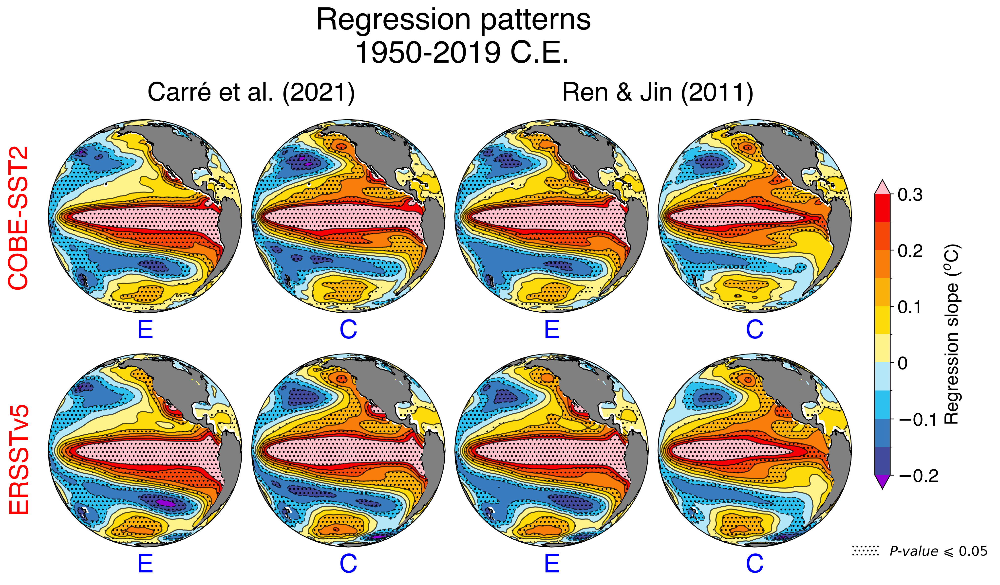

In [83]:
projection=ccrs.Orthographic(central_longitude=230,central_latitude=0)
c='gray'

hatch_style='...'

alpha=.1

min_=-0.2
max_=0.3

levels = [-0.2,-0.15,-0.1,-0.05,0,0.05,0.10,0.15,0.20,0.25,0.3]

my_colors = ['#424A9E','#397BBF','#2CC1EF','#B4E8F9',
             '#FEF38B','#FDDA09','#FAB20B','#F87D0A','#F64709','#F50006']

cmap = ListedColormap(sns.color_palette(my_colors).as_hex())

cmap.set_over('pink')
cmap.set_under('darkviolet')

norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=10)

fig = plt.figure(figsize=(14, 14)) 
gs = gridspec.GridSpec(ncols=4, nrows=2, figure=fig)

gs.update(wspace=0.05, hspace=0.01, bottom=0.1, top=0.55)

ax1 = fig.add_subplot(gs[0,0],projection=projection); ax2 = fig.add_subplot(gs[0,1],projection=projection); ax11 = fig.add_subplot(gs[0,2],projection=projection); ax22 = fig.add_subplot(gs[0,3],projection=projection);
ax3 = fig.add_subplot(gs[1,0],projection=projection); ax4 = fig.add_subplot(gs[1,1],projection=projection); ax33 = fig.add_subplot(gs[1,2],projection=projection); ax44 = fig.add_subplot(gs[1,3],projection=projection);

######################################################################################
###########################        Carré et al.       ################################
######################################################################################

ax1.set_global()
ax1.coastlines()
ax1.add_feature(cfeature.LAND,color=c)

im = reg_cobe_sst2.regE_1950_2019_Carre.plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax1.contour(im,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regE_1950_2019_Carre.where(reg_cobe_sst2.regE_1950_2019_pval_Carre<=0.05).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style],alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax2.set_global()
ax2.coastlines()
ax2.add_feature(cfeature.LAND,color=c)

im2 = reg_cobe_sst2.regC_1950_2019_Carre.plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax2.contour(im2,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regC_1950_2019_Carre.where(reg_cobe_sst2.regC_1950_2019_pval_Carre<=0.05).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

ax3.set_global()
ax3.coastlines()
ax3.add_feature(cfeature.LAND,color=c)

im3 = reg_ERSSTv5.regE_1950_2019_Carre.plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                              cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax3.contour(im3,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regE_1950_2019_Carre.where(reg_ERSSTv5.regE_1950_2019_pval_Carre<=0.05).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                                
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax4.set_global()
ax4.coastlines()
ax4.add_feature(cfeature.LAND,color=c)

im4 = reg_ERSSTv5.regC_1950_2019_Carre.plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                              cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax4.contour(im4,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regC_1950_2019_Carre.where(reg_ERSSTv5.regC_1950_2019_pval_Carre<=0.05).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                                
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################
############################        Ren & Jin       ##################################
######################################################################################

ax11.set_global()
ax11.coastlines()
ax11.add_feature(cfeature.LAND,color=c)

im5 = reg_cobe_sst2.regE_1950_2019_rj.plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                            cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax11.contour(im5,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regE_1950_2019_rj.where(reg_cobe_sst2.regE_1950_2019_pval_rj<=0.05).plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                            
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

ax22.set_global()
ax22.coastlines()
ax22.add_feature(cfeature.LAND,color=c)

im6 = reg_cobe_sst2.regC_1950_2019_rj.plot.contourf(ax=ax22, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                            cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax22.contour(im6,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regC_1950_2019_rj.where(reg_cobe_sst2.regC_1950_2019_pval_rj<=0.05).plot.contourf(ax=ax22, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                            
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

ax33.set_global()
ax33.coastlines()
ax33.add_feature(cfeature.LAND,color=c)

im7 = reg_ERSSTv5.regE_1950_2019_rj.plot.contourf(ax=ax33, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax33.contour(im7,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regE_1950_2019_rj.where(reg_ERSSTv5.regE_1950_2019_pval_rj<=0.05).plot.contourf(ax=ax33, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax44.set_global()
ax44.coastlines()
ax44.add_feature(cfeature.LAND,color=c)

im8 = reg_ERSSTv5.regC_1950_2019_rj.plot.contourf(ax=ax44, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax44.contour(im8,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regC_1950_2019_rj.where(reg_ERSSTv5.regC_1950_2019_pval_rj<=0.05).plot.contourf(ax=ax44, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


###################################   Colorbar   ######################################

axins = inset_axes(ax44,  
               width="8%",  
               height="160%",
               loc='lower left',
               bbox_to_anchor=(1.12, 0.3, 1, 1),
               bbox_transform=ax44.transAxes,
               borderpad=0,
               )

cb = fig.colorbar(im,cax=axins,norm=norm,cmap=cmap,
                  ticks=levels[::2],orientation='vertical',
                  extend='both',pad=0.1,fraction=0.5,aspect=5)


cb.ax.set_ylabel(r'Regression slope ($^o$C)', fontsize=18, labelpad=5,rotation=90.)
cb.ax.tick_params(labelsize=18)
cb.ax.yaxis.set_ticks(levels,minor=True)
cb.ax.set_yticklabels([r'$-$0.2', r'$-$0.1','0','0.1','0.2','0.3'])

######################################################################################

sz=25

ax1.text(0.5,-0.13, "E", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax1.transAxes)
ax11.text(0.5,-0.13, "E", size=sz, color='blue',fontweight='bold',ha="center", 
         transform=ax11.transAxes)
ax3.text(0.5,-0.13, "E", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax3.transAxes)
ax33.text(0.5,-0.13, "E", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax33.transAxes)

ax2.text(0.5,-0.13, "C", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax2.transAxes)
ax22.text(0.5,-0.13, "C", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax22.transAxes)
ax4.text(0.5,-0.13, "C", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax4.transAxes)
ax44.text(0.5,-0.13, "C", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax44.transAxes)

ax1.text(1.05,1.1, "Carré et al. (2021)", size=25, ha="center", 
         transform=ax1.transAxes)
ax11.text(1.05,1.1, "Ren & Jin (2011)", size=25, ha="center", 
         transform=ax11.transAxes)

ax1.text(-0.15,0.15, "COBE-SST2", size=25, color='r', ha="center", rotation='vertical',
         transform=ax1.transAxes)
ax3.text(-0.15,0.2, "ERSSTv5", size=25, color='r', ha="center", rotation='vertical',
         transform=ax3.transAxes)
 

legend_elements = [Patch(facecolor='white',alpha=.6,hatch=hatch_style,
                         label=r'$P$-$value \ \leqslant \ 0.05$')]

ax44.legend(handles=legend_elements, loc='lower left', fontsize=13, 
             bbox_to_anchor=(.94, -.12),fancybox=False, shadow=False,frameon=False)

plt.suptitle('Regression patterns \n 1950-2019 C.E.',fontsize=30,fontweight='bold',y=0.64,x=0.52)

## Figure S4

Text(0.5, 0.98, 'Regression patterns \n 1854-1950 C.E.')

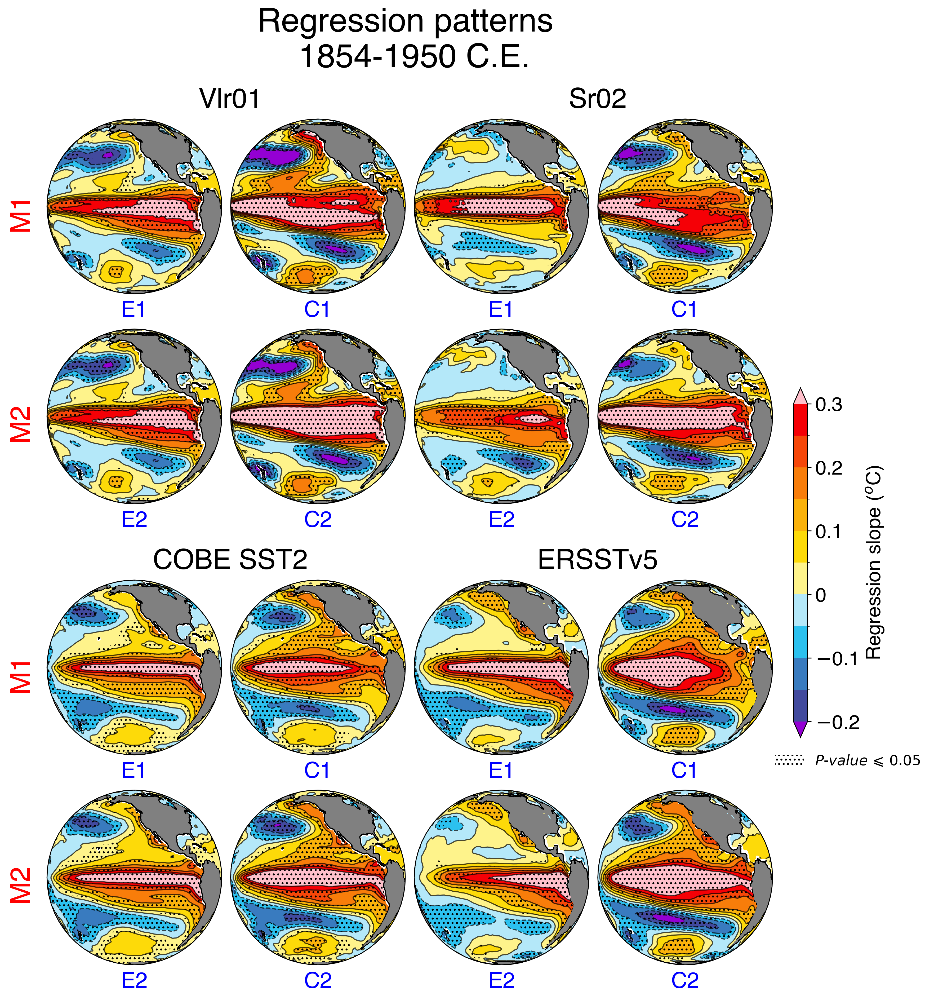

In [84]:
projection=ccrs.Orthographic(central_longitude=230,central_latitude=0)
c='gray'

hatch_style='...'

alpha=.1

min_=-0.2
max_=0.3

levels = [-0.2,-0.15,-0.1,-0.05,0,0.05,0.10,0.15,0.20,0.25,0.3]

my_colors = ['#424A9E','#397BBF','#2CC1EF','#B4E8F9',
             '#FEF38B','#FDDA09','#FAB20B','#F87D0A','#F64709','#F50006']
cmap = ListedColormap(sns.color_palette(my_colors).as_hex())

cmap.set_over('pink')
cmap.set_under('darkviolet')

norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=10)

heights = [3,3,0.1,3,3]

fig = plt.figure(figsize=(14, 14))  
gs = gridspec.GridSpec(ncols=4, nrows=5, figure=fig, height_ratios=heights)

gs.update(wspace=0.001, hspace=0.25, left=0.17, right=0.83, bottom=0.12, top=0.88)

ax1 = fig.add_subplot(gs[0,0],projection=projection); ax2 = fig.add_subplot(gs[0,1],projection=projection); ax11 = fig.add_subplot(gs[0,2],projection=projection); ax22 = fig.add_subplot(gs[0,3],projection=projection);
ax3 = fig.add_subplot(gs[1,0],projection=projection); ax4 = fig.add_subplot(gs[1,1],projection=projection); ax33 = fig.add_subplot(gs[1,2],projection=projection); ax44 = fig.add_subplot(gs[1,3],projection=projection);

ax5 = fig.add_subplot(gs[3,0],projection=projection); ax6 = fig.add_subplot(gs[3,1],projection=projection); ax55 = fig.add_subplot(gs[3,2],projection=projection); ax66 = fig.add_subplot(gs[3,3],projection=projection);
ax7 = fig.add_subplot(gs[4,0],projection=projection); ax8 = fig.add_subplot(gs[4,1],projection=projection); ax77 = fig.add_subplot(gs[4,2],projection=projection); ax88 = fig.add_subplot(gs[4,3],projection=projection);


######################################################################################
##############################        Vlr01       ####################################
######################################################################################

ax1.set_global()
ax1.coastlines()
ax1.add_feature(cfeature.LAND,color=c)

im = reg_simulations.regE_Vlr01.plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax1.contour(im,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regE_Vlr01.where(reg_simulations.regE_Vlr01_pval<=0.05).plot.contourf(ax=ax1, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style],alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax2.set_global()
ax2.coastlines()
ax2.add_feature(cfeature.LAND,color=c)

im2 = reg_simulations.regC_Vlr01.plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax2.contour(im2,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regC_Vlr01.where(reg_simulations.regC_Vlr01_pval<=0.05).plot.contourf(ax=ax2, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

ax3.set_global()
ax3.coastlines()
ax3.add_feature(cfeature.LAND,color=c)

im3 = reg_simulations.regE_Vlr01_.plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                              cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax3.contour(im3,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regE_Vlr01_.where(reg_simulations.regE_Vlr01_pval_<=0.05).plot.contourf(ax=ax3, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                                
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax4.set_global()
ax4.coastlines()
ax4.add_feature(cfeature.LAND,color=c)

im4 = reg_simulations.regC_Vlr01_.plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                              cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax4.contour(im4,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regC_Vlr01_.where(reg_simulations.regC_Vlr01_pval_<=0.05).plot.contourf(ax=ax4, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                                
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################
###############################        Sr02       ####################################
######################################################################################

ax11.set_global()
ax11.coastlines()
ax11.add_feature(cfeature.LAND,color=c)

im5 = reg_simulations.regE_Sr02.plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                            cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax11.contour(im5,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regE_Sr02.where(reg_simulations.regE_Sr02_pval<=0.05).plot.contourf(ax=ax11, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                            
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

ax22.set_global()
ax22.coastlines()
ax22.add_feature(cfeature.LAND,color=c)

im6 = reg_simulations.regC_Sr02.plot.contourf(ax=ax22, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                            cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax22.contour(im6,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regC_Sr02.where(reg_simulations.regC_Sr02_pval<=0.05).plot.contourf(ax=ax22, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                            
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')



######################################################################################

ax33.set_global()
ax33.coastlines()
ax33.add_feature(cfeature.LAND,color=c)

im7 = reg_simulations.regE_Sr02_.plot.contourf(ax=ax33, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                             cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax33.contour(im7,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regE_Sr02_.where(reg_simulations.regE_Sr02_pval_<=0.05).plot.contourf(ax=ax33, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################

ax44.set_global()
ax44.coastlines()
ax44.add_feature(cfeature.LAND,color=c)

im8 = reg_simulations.regC_Sr02_.plot.contourf(ax=ax44, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax44.contour(im8,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_simulations.regC_Sr02_.where(reg_simulations.regC_Sr02_pval_<=0.05).plot.contourf(ax=ax44, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')


######################################################################################
############################        COBE SST2       ##################################
######################################################################################

ax5.set_global()
ax5.coastlines()
ax5.add_feature(cfeature.LAND,color=c)

im9 = reg_cobe_sst2.regE_1854_1950.plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax5.contour(im9,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regE_1854_1950.where(reg_cobe_sst2.regE_1854_1950_pval<=0.05).plot.contourf(ax=ax5, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax6.set_global()
ax6.coastlines()
ax6.add_feature(cfeature.LAND,color=c)

im10 = reg_cobe_sst2.regC_1854_1950.plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax6.contour(im10,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regC_1854_1950.where(reg_cobe_sst2.regC_1854_1950_pval<=0.05).plot.contourf(ax=ax6, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax7.set_global()
ax7.coastlines()
ax7.add_feature(cfeature.LAND,color=c)

im11 = reg_cobe_sst2.regE_1854_1950_.plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax7.contour(im11,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regE_1854_1950_.where(reg_cobe_sst2.regE_1854_1950_pval_<=0.05).plot.contourf(ax=ax7, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax8.set_global()
ax8.coastlines()
ax8.add_feature(cfeature.LAND,color=c)

im12 = reg_cobe_sst2.regC_1854_1950_.plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax8.contour(im12,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_cobe_sst2.regC_1854_1950_.where(reg_cobe_sst2.regC_1854_1950_pval_<=0.05).plot.contourf(ax=ax8, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################
#############################        ERSSTv5       ###################################
######################################################################################

ax55.set_global()
ax55.coastlines()
ax55.add_feature(cfeature.LAND,color=c)

im13 = reg_ERSSTv5.regE_1854_1950.plot.contourf(ax=ax55, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax55.contour(im13,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regE_1854_1950.where(reg_ERSSTv5.regE_1854_1950_pval<=0.05).plot.contourf(ax=ax55, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax66.set_global()
ax66.coastlines()
ax66.add_feature(cfeature.LAND,color=c)

im14 = reg_ERSSTv5.regC_1854_1950.plot.contourf(ax=ax66, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax66.contour(im14,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regC_1854_1950.where(reg_ERSSTv5.regC_1854_1950_pval<=0.05).plot.contourf(ax=ax66, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax77.set_global()
ax77.coastlines()
ax77.add_feature(cfeature.LAND,color=c)

im15 = reg_ERSSTv5.regE_1854_1950_.plot.contourf(ax=ax77, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax77.contour(im15,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regE_1854_1950_.where(reg_ERSSTv5.regE_1854_1950_pval_<=0.05).plot.contourf(ax=ax77, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

######################################################################################

ax88.set_global()
ax88.coastlines()
ax88.add_feature(cfeature.LAND,color=c)

im16 = reg_ERSSTv5.regC_1854_1950_.plot.contourf(ax=ax88, transform=ccrs.PlateCarree(), x='lon', y='lat',
                             
                                 cmap=cmap,levels=levels,extend='both',add_colorbar=False,norm=norm)

ax88.contour(im16,linewidths=1, colors='k',alpha=.7,transform=ccrs.PlateCarree())

reg_ERSSTv5.regC_1854_1950_.where(reg_ERSSTv5.regC_1854_1950_pval_<=0.05).plot.contourf(ax=ax88, transform=ccrs.PlateCarree(), x='lon', y='lat',
                                                        add_colorbar=False,levels=levels,
                                                              
                                                        hatches=['', hatch_style], alpha=alpha,
                                                            cmap=cmap,norm=norm,extend='both')

###################################   Colorbar   ######################################

axins = inset_axes(ax66,  
               width="8%",   
               height="200%",
               loc='lower left',
               bbox_to_anchor=(1.12, 0.1, 1, 1),
               bbox_transform=ax66.transAxes,
               borderpad=0,
               )

cb = fig.colorbar(im,cax=axins,norm=norm,cmap=cmap,
                  ticks=levels[::2],orientation='vertical',
                  extend='both',pad=0.1,fraction=0.5,aspect=5)


cb.ax.set_ylabel(r'Regression slope ($^o$C)', fontsize=18, labelpad=5,rotation=90.)
cb.ax.tick_params(labelsize=18)
cb.ax.yaxis.set_ticks(levels,minor=True)
cb.ax.set_yticklabels([r'$-$0.2', r'$-$0.1','0','0.1','0.2','0.3'])

######################################################################################

sz=20

ax1.text(0.5,-0.13, "E1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax1.transAxes)
ax11.text(0.5,-0.13, "E1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax11.transAxes)
ax3.text(0.5,-0.13, "E2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax3.transAxes)
ax33.text(0.5,-0.13, "E2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax33.transAxes)

ax5.text(0.5,-0.13, "E1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax5.transAxes)
ax55.text(0.5,-0.13, "E1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax55.transAxes)
ax7.text(0.5,-0.13, "E2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax7.transAxes)
ax77.text(0.5,-0.13, "E2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax77.transAxes)

ax2.text(0.5,-0.13, "C1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax2.transAxes)
ax22.text(0.5,-0.13, "C1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax22.transAxes)
ax4.text(0.5,-0.13, "C2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax4.transAxes)
ax44.text(0.5,-0.13, "C2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax44.transAxes)

ax6.text(0.5,-0.13, "C1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax6.transAxes)
ax66.text(0.5,-0.13, "C1", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax66.transAxes)
ax8.text(0.5,-0.13, "C2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax8.transAxes)
ax88.text(0.5,-0.13, "C2", size=sz, color='blue', fontweight='bold',ha="center", 
         transform=ax88.transAxes)

ax1.text(1.05,1.065, "Vlr01", size=25, ha="center", 
         transform=ax1.transAxes)
ax11.text(1.05,1.065, "Sr02", size=25, ha="center", 
         transform=ax11.transAxes)

ax5.text(1.05,1.065, "COBE SST2", size=25, ha="center", 
         transform=ax5.transAxes)
ax55.text(1.05,1.065, "ERSSTv5", size=25, ha="center", 
         transform=ax55.transAxes)

ax1.text(-0.15,0.39, "M1", size=25, color='red', ha="center", rotation='vertical',
         transform=ax1.transAxes)
ax3.text(-0.15,0.39, "M2", size=25, color='red', ha="center", rotation='vertical',
         transform=ax3.transAxes)

ax5.text(-0.15,0.39, "M1", size=25, color='red', ha="center", rotation='vertical',
         transform=ax5.transAxes)
ax7.text(-0.15,0.39, "M2", size=25, color='red', ha="center", rotation='vertical',
         transform=ax7.transAxes)

######

legend_elements = [Patch(facecolor='white',alpha=.6,hatch=hatch_style,
                         label=r'$P$-$value \ \leqslant \ 0.05$')]

ax66.legend(handles=legend_elements, loc='lower left', fontsize=13, 
             bbox_to_anchor=(.94, -.15),fancybox=False, shadow=False,frameon=False)

plt.suptitle('Regression patterns \n 1854-1950 C.E.',fontsize=30,fontweight='bold',y=.98,x=.5)

## Figure S5a

In [85]:
thermocline_mh = xr.open_dataset(data_folder/'eof_holocene/mean_state/thedepth_mh.nc')
thermocline_pi = xr.open_dataset(data_folder/'eof_holocene/mean_state/thedepth_pi.nc')

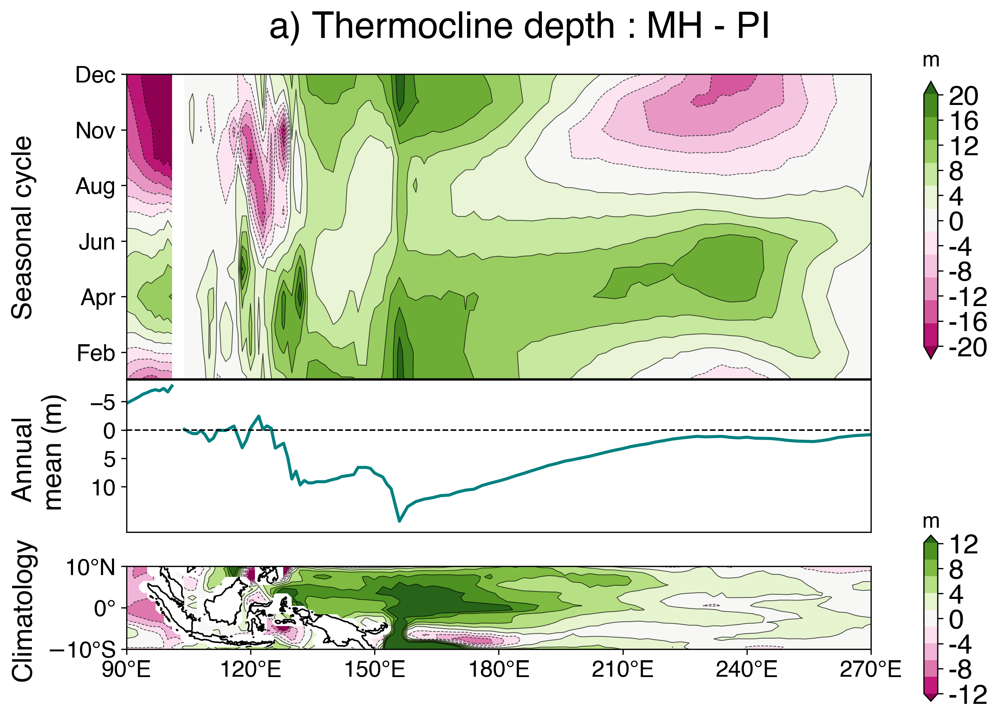

In [86]:
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15

MH = thermocline_mh.thedepth.isel(time_counter=slice(0,6000)).sel(lon=slice(90,270))

PI = thermocline_pi.thedepth.isel(time_counter=slice(-6000,-1)).sel(lon=slice(90,270))

cmap = plt.cm.PiYG

fig = plt.figure(figsize=(11, 7.2))  
gs = gridspec.GridSpec(ncols=4, nrows=4, figure=fig)

ax0 = fig.add_subplot(gs[0:2, :])
im = (MH.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.month').mean(dim='time_counter') - \
      PI.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.month').mean(dim='time_counter')).plot.contourf(ax=ax0,\
            levels=np.linspace(-20,20.1, 12),y='month',x='lon',extend='both',cmap=cmap,add_colorbar=False)

ax0.contour(im,linewidths=.5, colors='k',alpha=.7)

ax0.set_ylabel('Seasonal cycle', fontsize=18, labelpad=25)
ax0.set_yticks([2,4,6,8,10,12])
ax0.set_yticklabels(['Feb','Apr','Jun','Aug','Nov','Dec'])

ax0.set_xlabel('')
ax0.set_xticks([])

cax,kw = matplotlib.colorbar.make_axes(ax0,location='right',pad=0.1,shrink=.95)
cb = fig.colorbar(im,cax=cax,format='%.0f',ticks=np.arange(-20,20.1,step=4),extend='both',**kw)
cb.ax.set_title(label=r'm', fontsize=14, pad=10)
cb.ax.tick_params(labelsize=18) 

ax1 = fig.add_subplot(gs[2, :])

(MH.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.year').mean().mean(dim='year')-\
 PI.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.year').mean().mean(dim='year')).plot(ax=ax1,x='lon',color='teal',linewidth=2)

ax1.plot((90, 270), (0,0), 'k--',linewidth=1)

ax1.set_ylim(-9,18)
ax1.set_ylabel('Annual \n mean (m)', fontsize=18,labelpad=15)
ax1.set_yticks([-5,0,5,10])
ax1.set_xlabel(r'Longitude',fontsize = 20.0)
ax1.set_xlim(90,270)
ax1.set_xlabel('')
ax1.set_xticks([])
ax1.invert_yaxis()

projection = ccrs.PlateCarree(central_longitude=180)
ax2 = fig.add_subplot(gs[3:, :], projection = projection)
ax2.set_extent([90, 270, -10, 10], ccrs.PlateCarree())
ax2.coastlines()

im2 = (MH.sel(lat=slice(-11,11)).mean(dim='time_counter')-\
       PI.sel(lat=slice(-11,11)).mean(dim='time_counter')).plot.contourf(ax=ax2,transform=ccrs.PlateCarree(),x='lon', y='lat',add_colorbar=False,
                                                           cmap=cmap, levels=np.linspace(-12,12.1, 10),
                                                           extend='both')

ax2.contour(im2,linewidths=.5, colors='k',alpha=.7,transform=ccrs.PlateCarree())

ax2.set_title('')
ax2.text(-0.12, 0.48,"Climatology", fontsize=18, va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax2.transAxes)
cax,kw = matplotlib.colorbar.make_axes(ax2,location='right',pad=0.5,shrink=1.25,aspect=12)
cb = fig.colorbar(im2,cax=cax,format='%.0f',ticks=np.arange(-12,12.1,step=4),extend='both',**kw)
cb.ax.set_title(label=r'm', fontsize=14, pad=10)
cb.ax.tick_params(labelsize=18) 

ax2.set_yticks([-10,0,10],crs=ccrs.PlateCarree())
ax2.set_yticklabels([r'$-$10°S',r'0°',r'10°N'],)
ax2.set_ylabel('')

ax2.set_xticks(np.arange(90,271,30),crs=ccrs.PlateCarree())
ax2.set_xticklabels([r'90°E',r'120°E',r'150°E',r'180°E',r'210°E',r'240°E',r'270°E'],)
ax2.set_xlabel('')

plt.subplots_adjust(wspace=0.8,hspace=-0.008,right=0.74)  

plt.suptitle(r"a) Thermocline depth : MH - PI", fontsize=24,y=.96,x=.45)

plt.show()

## Figure S5b

In [87]:
sst_mh = xr.open_dataset(data_folder/'eof_holocene/mean_state/tos_mh.nc')['tos']
sst_pi = xr.open_dataset(data_folder/'eof_holocene/mean_state/tos_pi.nc')['tos']

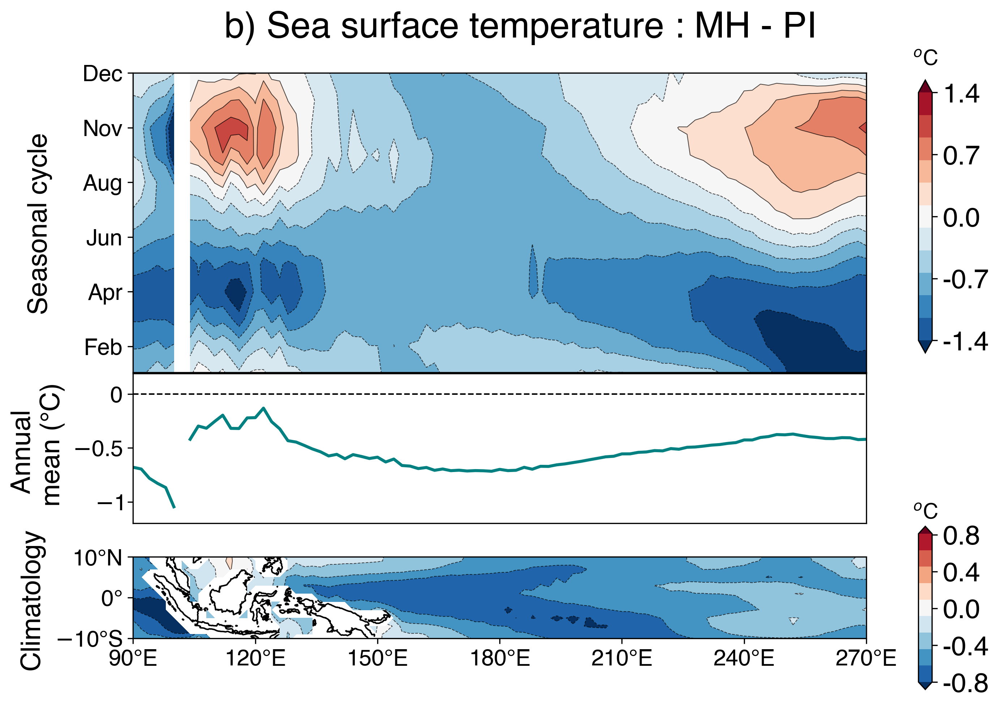

In [88]:
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15

MH = sst_mh.isel(time_counter=slice(0,6000)).sel(lon=slice(90,270)) 

PI = sst_pi.isel(time_counter=slice(-6000,-1)).sel(lon=slice(90,270)) 

cmap = plt.cm.RdBu_r

fig = plt.figure(figsize=(11, 7.2)) # width x height
gs = gridspec.GridSpec(ncols=4, nrows=4, figure=fig)

ax0 = fig.add_subplot(gs[0:2, :])
im = (MH.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.month').mean(dim='time_counter') - \
      PI.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.month').mean(dim='time_counter')).plot.contourf(ax=ax0,levels=np.linspace(-1.4,1.4, 12),y='month',x='lon',extend='both',cmap=cmap,add_colorbar=False)

ax0.contour(im,linewidths=.5, colors='k',alpha=.7)

ax0.set_ylabel('Seasonal cycle', fontsize=18, labelpad=20)
ax0.set_yticks([2,4,6,8,10,12])
ax0.set_yticklabels(['Feb','Apr','Jun','Aug','Nov','Dec'])

ax0.set_xlabel('')
ax0.set_xticks([])

cax,kw = matplotlib.colorbar.make_axes(ax0,location='right',pad=0.1,shrink=.95)
cb = fig.colorbar(im,cax=cax,format='%.1f',ticks=np.arange(-1.4,1.41,step=0.7),extend='both',**kw)
cb.ax.set_title(label=r'$^o$C', fontsize=14, pad=10)
cb.ax.tick_params(labelsize=18) 

ax1 = fig.add_subplot(gs[2, :])

(MH.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.year').mean().mean(dim='year')-\
 PI.sel(lat=slice(-5,5)).mean(dim='lat').groupby('time_counter.year').mean().mean(dim='year')).plot(ax=ax1,x='lon',color='teal',linewidth=2)

ax1.plot((90, 270), (0,0), 'k--',linewidth=1)

ax1.set_ylim(-1.2,0.2)
ax1.set_ylabel('Annual \n mean (°C)', fontsize=18,labelpad=5)
ax1.set_yticks([-1,-.5,0])
ax1.set_yticklabels(['$-$1','$-$0.5','0'])
ax1.set_xlabel(r'Longitude',fontsize = 20.0)
ax1.set_xlim(90,270)
ax1.set_xlabel('')
ax1.set_xticks([])

projection = ccrs.PlateCarree(central_longitude=180)
ax2 = fig.add_subplot(gs[3:, :], projection = projection)
ax2.set_extent([90, 270, -10, 10], ccrs.PlateCarree())
ax2.coastlines()

im2 = (MH.sel(lat=slice(-11,11)).mean(dim='time_counter')-\
       PI.sel(lat=slice(-11,11)).mean(dim='time_counter')).plot.contourf(ax=ax2,transform=ccrs.PlateCarree(),x='lon', y='lat',add_colorbar=False,
                                                           cmap=cmap, levels=np.linspace(-0.8,0.81, 10),
                                                           extend='both')

ax2.contour(im2,linewidths=.5, colors='k',alpha=.7,transform=ccrs.PlateCarree())

ax2.set_title('')
ax2.text(-0.12, 0.48,"Climatology", fontsize=18, va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor',
        transform=ax2.transAxes)
cax,kw = matplotlib.colorbar.make_axes(ax2,location='right',pad=0.5,shrink=1.25,aspect=12)
cb = fig.colorbar(im2,cax=cax,format='%.1f',ticks=np.arange(-0.8,0.81,step=0.4),extend='both',**kw)
cb.ax.set_title(label=r'$^o$C', fontsize=14, pad=10)
cb.ax.tick_params(labelsize=18) 


ax2.set_yticks([-10,0,10],crs=ccrs.PlateCarree())
ax2.set_yticklabels([r'$-$10°S',r'0°',r'10°N'],)
ax2.set_ylabel('')

ax2.set_xticks(np.arange(90,271,30),crs=ccrs.PlateCarree())
ax2.set_xticklabels([r'90°E',r'120°E',r'150°E',r'180°E',r'210°E',r'240°E',r'270°E'],)
ax2.set_xlabel('')

plt.subplots_adjust(wspace=0.8,hspace=-0.008,right=0.74) #only if constrained_layout=False

plt.suptitle(r"b) Sea surface temperature : MH - PI", fontsize=24,y=.96,x=.45)

plt.show()

## Figure S6

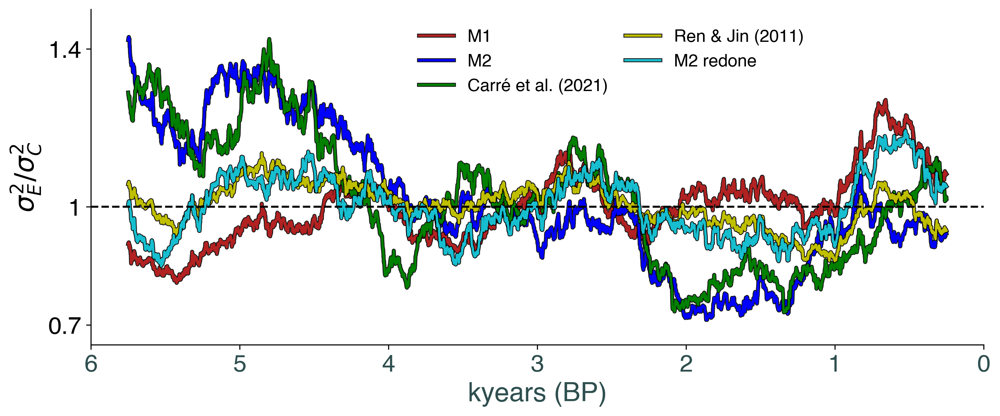

In [89]:
plt.figure(figsize=(12,10))


plt.subplot(211)

width=1.75
path_effects=[pe.Stroke(linewidth=3, foreground='black',alpha=.9), pe.Normal()]

R_Vlr01.plot(color='firebrick',label='M1',linewidth=width,path_effects=path_effects)
R_Vlr01_.plot(color='blue',label='M2',linewidth=width,path_effects=path_effects)
R_Carre_Vlr01.plot(color='g',label='Carré et al. (2021)',linewidth=width,path_effects=path_effects)
R_Vlr01_rj.plot(color='y',label='Ren & Jin (2011)',linewidth=width,path_effects=path_effects)
R_Vlr01_bis.plot(color='tab:cyan',linewidth=width,label='M2 redone',path_effects=path_effects)

plt.axhline(y=1.0, color="black", linestyle="--")

plt.ylabel(r'$\sigma^2_E/\sigma^2_C$',fontsize=20)
plt.ylim(0.65,1.5)
plt.yticks([0.7,1,1.4],['0.7','1','1.4'],fontsize=18)

plt.xlim(2000,8000)
plt.xticks([2000,3000,4000,5000,6000,7000,8000],['6','5','4','3','2','1','0'],fontsize=18,color='darkslategray')

plt.xlabel('kyears (BP)', fontsize=20, color='darkslategray')

plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

plt.legend(loc='lower left', fontsize=13, 
             bbox_to_anchor=(.35, 0.7),fancybox=False, 
           shadow=False,frameon=False, ncol=2, columnspacing=1)